In [ ]:
!pip install sktime

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import pandas as pd
import numpy as np
import torch
from tqdm.auto import tqdm
import random
import os

def reset_seeds(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True

DATA_PATH = '/content/drive/MyDrive/데이콘 캐글 컴페티션/DACON_23.07_PowerConsumption/'
SEED = 42

device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

In [3]:
ensemble= pd.read_csv(f"{DATA_PATH}ensemble.csv")

In [6]:
feature_5 = pd.read_csv(f"{DATA_PATH}submission_feature5.csv") #6.32

In [7]:
feature_7 = pd.read_csv(f"{DATA_PATH}submission_feature7.csv") #6.29

In [10]:
ensemble['answer']

0        2052.409188
1        2018.425686
2        1853.297454
3        1817.609590
4        1830.248831
            ...     
16795     830.522656
16796     768.734392
16797     708.589805
16798     571.794440
16799     500.311512
Name: answer, Length: 16800, dtype: float64

In [9]:
feature_5['answer']

0        2088.013620
1        2185.183963
2        2042.895355
3        1935.015223
4        1969.540077
            ...     
16795     853.455083
16796     807.298618
16797     744.839623
16798     576.106314
16799     509.616150
Name: answer, Length: 16800, dtype: float64

In [14]:
diff = (feature_5['answer'] - ensemble['answer']).tolist()

In [12]:
def absolute_mean(numbers):
    absolute_values = [abs(x) for x in numbers]
    mean = sum(absolute_values) / len(absolute_values)
    return mean
# 절대값의 평균

In [15]:
absolute_mean(diff)

50.62111892185473

In [16]:
def calculate_absolute_mean(data):
    absolute_values = [abs(x) for x in data]
    mean = sum(absolute_values) / len(absolute_values)
    return mean

def calculate_diff_and_absolute_mean(a, b, chunk_size):
    num_chunks = len(a) // chunk_size

    absolute_mean_results = []

    for i in range(num_chunks):
        start_idx = i * chunk_size
        end_idx = (i + 1) * chunk_size

        diff_chunk = [a[j] - b[j] for j in range(start_idx, end_idx)]
        absolute_mean = calculate_absolute_mean(diff_chunk)
        absolute_mean_results.append(absolute_mean)

    return absolute_mean_results

# a와 b 데이터 리스트를 생성하거나 가져온 후 리스트에 저장합니다.
a_data = [...]  # a 데이터 리스트를 채워넣으세요.
b_data = [...]  # b 데이터 리스트를 채워넣으세요.

chunk_size = 168
result = calculate_diff_and_absolute_mean(a_data, b_data, chunk_size)
print("각 구간별 절대값의 평균:", result)


각 구간별 절대값의 평균: []


In [19]:
calculate_diff_and_absolute_mean(feature_5['answer'], ensemble['answer'], 168)

[145.1703663719788,
 45.969733981105215,
 57.59459515173235,
 13.653327282836718,
 190.06289917824395,
 59.111085453893544,
 18.54763405952617,
 24.357108581462608,
 40.60149598445605,
 100.50978372985443,
 33.17494304505148,
 31.02931774497659,
 20.045295253487478,
 63.613731954284674,
 17.405176782228448,
 64.26330203756459,
 24.307871054579444,
 37.93909780139376,
 70.06616829006255,
 62.54575885512251,
 62.12790609762,
 12.571706553878139,
 27.216807384659994,
 192.92169925881885,
 72.87168515792439,
 41.786787634466485,
 429.72108224846824,
 20.133014072049267,
 19.510269013073774,
 23.419782022362558,
 19.44720188146175,
 45.707773269926975,
 70.01495227796752,
 30.696502075270537,
 3.182873375448475,
 6.247374202312872,
 111.45081479496251,
 66.28660126184893,
 42.46180587950863,
 69.38811903724451,
 39.203101525976315,
 69.69269315274475,
 27.85526743687907,
 20.390513244759784,
 42.3124749780169,
 36.92225626816552,
 119.21162848720797,
 22.82950310728508,
 59.943850842288626,

In [ ]:
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
import sktime
from sktime.forecasting.model_selection import temporal_train_test_split
from sktime.utils.plotting import plot_series
import matplotlib.pyplot as plt
from sklearn.metrics import make_scorer
from lightgbm import early_stopping
import xgboost as xgb
import seaborn as sns

In [ ]:
def _smape(true, pred):
    true = np.array(true)
    pred = np.array(pred)
    output = np.mean((np.abs(true-pred))/(np.abs(true) + np.abs(pred))) * 100
    return output
smape = make_scorer(_smape, greater_is_better=False)

In [ ]:
train = pd.read_csv(f"{DATA_PATH}train.csv")
test = pd.read_csv(f"{DATA_PATH}test.csv")
building = pd.read_csv(f"{DATA_PATH}building_info.csv")
submission = pd.read_csv(f"{DATA_PATH}sample_submission.csv")

In [ ]:
train_ft = pd.read_csv(f"{DATA_PATH}train_feature5.csv")
test_ft = pd.read_csv(f"{DATA_PATH}test_feature5.csv")


# train_ft = pd.read_csv(f"{DATA_PATH}train_selected_3.csv")
# test_ft = pd.read_csv(f"{DATA_PATH}test_selected_3.csv")

# df = pd.read_csv(f"{DATA_PATH}train_featured_3.csv")


In [ ]:
# cols = ['day_hour_mean', 'day_hour_median', 'discomfort_CDH', 'week',
#        'day_hour_mode', 'discomfort', 'day_hour_std', 'CDH', 'hour_mean',
#        'sin_time', 'cos_week','building_num','energy_consum']

# train_ft = df[cols]

- 피처추가

In [ ]:
train_ft.columns

Index(['energy_consum', 'building_num', 'temp', 'precip', 'wind', 'hum', 'day',
       'month', 'week', 'day_of_year', 'sin_time', 'cos_time', 'THI',
       'feels_temp', 'CDH', 'hour_mean'],
      dtype='object')

In [ ]:

# # train 불쾌지수 계산하여 discomfort 열 추가
# train_ft['discomfort'] = calculate_discomfort(train_ft['temp'], train_ft['hum'])

# # CDH 계산
# cdhs = np.array([])
# for num in range(1, 101):
#     temp = train_ft[train_ft['building_num'] == num]
#     cdh = np.cumsum(temp['discomfort'].values - 26)  # discomfort 값에서 26을 뺀 후 누적 합 계산
#     cdhs = np.concatenate([cdhs, cdh])
# train_ft['discomfort_CDH'] = cdhs

# # test불쾌지수 계산하여 discomfort 열 추가
# test_ft['discomfort'] = calculate_discomfort(test_ft['temp'], test_ft['hum'])

# # CDH 계산
# cdhs = np.array([])
# for num in range(1, 101):
#     temp = test_ft[test_ft['building_num'] == num]
#     cdh = np.cumsum(temp['discomfort'].values - 26)  # discomfort 값에서 26을 뺀 후 누적 합 계산
#     cdhs = np.concatenate([cdhs, cdh])
# test_ft['discomfort_CDH'] = cdhs

In [ ]:
train_ft.shape, test_ft.shape

((201600, 16), (16800, 15))

In [ ]:
# columns_to_drop = ['discomfort']  # 삭제할 칼럼 이름들

# train_ft = train_ft.drop(columns=columns_to_drop)
# test_ft = test_ft.drop(columns=columns_to_drop)


- 건물별 ft 생성

In [ ]:
for i in range(1, 101):
    globals()[f'train_ft_{i}'] = train_ft[train_ft['building_num'] == i]

for i in range(1, 101):
    globals()[f'test_ft_{i}'] = test_ft[test_ft['building_num'] == i]

In [ ]:
columns_to_drop = ['precip']  # 삭제할 칼럼 이름들
# target_indices = [1, 9, 15, 19, 25, 28, 32, 36, 41, 79, 81, 82, 91, 92, 99, 100]  # 특정 i 값들
target_indices = [3,9,42, 54,72,82,91,92 ]  # 특정 i 값들


for i in range(1, 101):
    if i in target_indices:  # i 값이 특정 값인 경우에만 칼럼 삭제
        train_subset = globals()[f'train_ft_{i}'].drop(columns=columns_to_drop)
        test_subset = globals()[f'test_ft_{i}'].drop(columns=columns_to_drop)
    else:
        train_subset = globals()[f'train_ft_{i}']
        test_subset = globals()[f'test_ft_{i}']

    # 데이터 프레임 갱신
    globals()[f'train_ft_{i}'] = train_subset
    globals()[f'test_ft_{i}'] = test_subset

In [ ]:
# columns_to_drop = ['building_num']  # 삭제할 칼럼 이름들

# for i in range(1, 101):
#     if i not in [1, 24, 25, 33, 42, 71, 77, 78, 79, 84, 88, 89]:  # i 값이 특정값 아닌 경우에만 building num 지우기
#         globals()[f'train_ft_{i}'] = globals()[f'train_ft_{i}'].drop(columns=columns_to_drop)
#         globals()[f'test_ft_{i}'] = globals()[f'test_ft_{i}'].drop(columns=columns_to_drop)


In [ ]:
columns_to_drop = ['building_num']  # 삭제할 칼럼 이름들
target_indices = [9,38,80]
# target_indices = [2, 7, 9, 11, 13, 16, 19, 23, 28, 31, 37, 38, 40, 43, 48, 49, 50, 52, 54, 56, 58, 59, 60, 64, 66, 73, 74, 80, 83, 91, 94, 99]  # 특정 i 값들

for i in range(1, 101):
    if i in target_indices:  # i 값이 특정 값인 경우에만 칼럼 삭제
        train_subset = globals()[f'train_ft_{i}'].drop(columns=columns_to_drop)
        test_subset = globals()[f'test_ft_{i}'].drop(columns=columns_to_drop)
    else:
        train_subset = globals()[f'train_ft_{i}']
        test_subset = globals()[f'test_ft_{i}']

    # 데이터 프레임 갱신
    globals()[f'train_ft_{i}'] = train_subset
    globals()[f'test_ft_{i}'] = test_subset


# 1, 3, 39, 44, 72, 79, 82, 88, 92 discomfort chd 때문에 추가 -> 했다가 뺌


- discomfort chd

In [ ]:
# 불쾌지수 계산 함수
def calculate_discomfort(temp, humidity):
    discomfort = 0.81 * temp + 0.01 * humidity * (0.99 * temp - 14.3) + 46.3
    return discomfort


# target_indices = [1, 3, 39, 42, 44, 54, 65, 72, 75, 76, 79, 82, 87, 88, 92]  # 특정 i 값들
target_indices = [38,42]

for i in range(1, 101):
    train_subset = globals()[f'train_ft_{i}']
    test_subset = globals()[f'test_ft_{i}']

    # 특정 i 값들에 대해서만 discomfort 및 discomfort_CDH 칼럼 추가
    if i in target_indices:
        train_subset['discomfort'] = calculate_discomfort(train_subset['temp'], train_subset['hum'])
        train_cdh = np.cumsum(train_subset['discomfort'].values - 26)
        train_subset['discomfort_CDH'] = train_cdh

        test_subset['discomfort'] = calculate_discomfort(test_subset['temp'], test_subset['hum'])
        test_cdh = np.cumsum(test_subset['discomfort'].values - 26)
        test_subset['discomfort_CDH'] = test_cdh

        # discomfort 칼럼 삭제
        train_subset = train_subset.drop(columns=['discomfort'])
        test_subset = test_subset.drop(columns=['discomfort'])

    # 추가된 칼럼을 포함한 데이터 프레임으로 덮어쓰기
    globals()[f'train_ft_{i}'] = train_subset
    globals()[f'test_ft_{i}'] = test_subset

- 함수

In [ ]:
def make_dataset(train_ft, test_ft):
    train_x = train_ft.iloc[:, 2:]
    train_y = train_ft['energy_consum']

    test_x = test_ft.iloc[:, 1:]
    return train_x, train_y, test_x

def train_test_split(train_x, train_y, test_size=168):
    y_train, y_valid, x_train, x_valid = temporal_train_test_split(y = train_y, X = train_x, test_size = test_size)
    return x_train, y_train, x_valid, y_valid


In [ ]:

def lightgbm_smape(y_true, y_pred):
    smape_val = _smape(y_true, y_pred)
    return 'SMAPE', smape_val, False

# LGBMRegressor 모델
def lgbm_predict(model, x_train, y_train, x_valid, y_valid, stopping=300, eval_metric=lightgbm_smape):
    model.fit(x_train, y_train, eval_set=[(x_train, y_train), (x_valid, y_valid)], callbacks = [early_stopping(stopping)], eval_metric=eval_metric)
    pred = model.predict(x_valid)
    pred = pd.Series(pred)
    pred.index = np.arange(y_valid.index[0], y_valid.index[-1]+1)
    plot_series(y_train, y_valid, pd.Series(pred), markers=[',' , ',', ','])
    smape_score = _smape(y_valid, pred)
    print(f"SMAPE_SCORE : {smape_score}")
    return smape_score

# test dataset 예측
def lgbm_test_predict(model, train_x, train_y, test_x):
    model.fit(train_x, train_y)
    lgbm_pred = model.predict(test_x)
    return lgbm_pred

In [ ]:
# LGBM 모델 사용

smape_score = []
lgbm_preds = np.array([])

def lgbm_evaluation(train_ft, test_ft) :
    global lgbm_preds

    model = LGBMRegressor(random_state=SEED, objective='regression', force_row_wise=True)
    train_x, train_y, test_x = make_dataset(train_ft, test_ft)
    x_train, y_train, x_valid, y_valid = train_test_split(train_x, train_y)

    score = lgbm_predict(model, x_train, y_train, x_valid, y_valid)
    smape_score.append(score)

    lgbm_pred = lgbm_test_predict(model, train_x, train_y, test_x)
    lgbm_preds = np.concatenate([lgbm_preds, lgbm_pred])

    print(smape_score)

## 1

[LightGBM] [Info] Total Bins 1274
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 2645.323115
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[69]	training's l2: 9713.71	training's SMAPE: 1.58716	valid_1's l2: 41362.8	valid_1's SMAPE: 3.08443
SMAPE_SCORE : 3.0844281297944103
[LightGBM] [Info] Total Bins 1284
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 2663.085236
[3.0844281297944103]


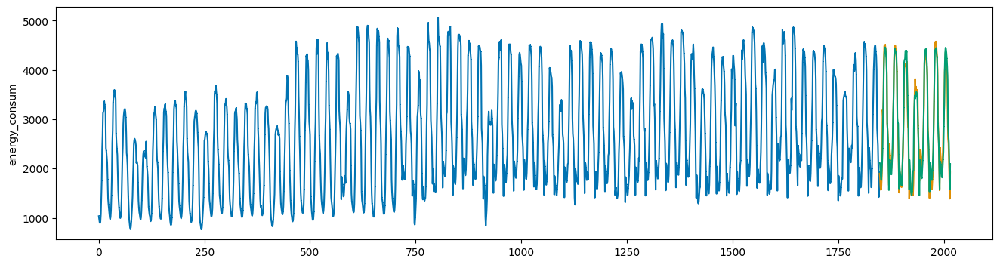

In [ ]:
lgbm_evaluation(train_ft_1, test_ft_1)

## 2

[LightGBM] [Info] Total Bins 1270
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 1679.106526
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[60]	training's l2: 8645.3	training's SMAPE: 2.22735	valid_1's l2: 44293.6	valid_1's SMAPE: 4.66783
SMAPE_SCORE : 4.6678268017904045
[LightGBM] [Info] Total Bins 1279
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 1681.879911
[3.0844281297944103, 4.6678268017904045]


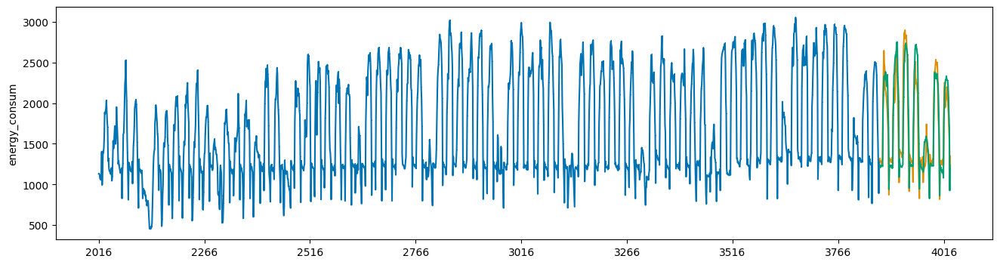

In [ ]:
lgbm_evaluation(train_ft_2, test_ft_2)

## 3

[LightGBM] [Info] Total Bins 1223
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 13
[LightGBM] [Info] Start training from score 1455.236007
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[39]	training's l2: 19271.6	training's SMAPE: 3.2988	valid_1's l2: 60709.1	valid_1's SMAPE: 7.43236
SMAPE_SCORE : 7.4323617990910344
[LightGBM] [Info] Total Bins 1232
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 13
[LightGBM] [Info] Start training from score 1447.292411
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344]


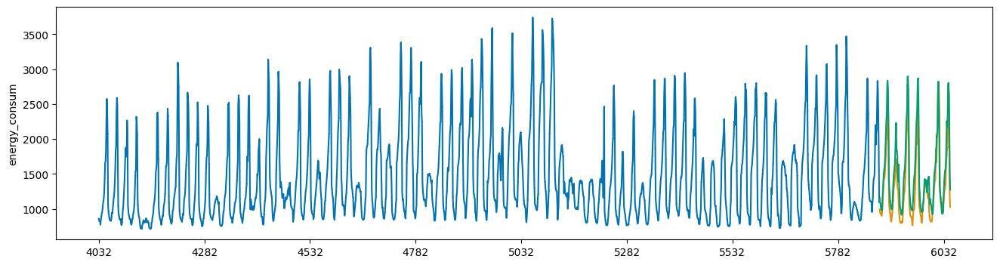

In [ ]:
lgbm_evaluation(train_ft_3, test_ft_3)

## 4

[LightGBM] [Info] Total Bins 1274
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 993.900049
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[78]	training's l2: 592.206	training's SMAPE: 1.05831	valid_1's l2: 3467.92	valid_1's SMAPE: 2.38936
SMAPE_SCORE : 2.389363956652109
[LightGBM] [Info] Total Bins 1284
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 996.501741
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109]


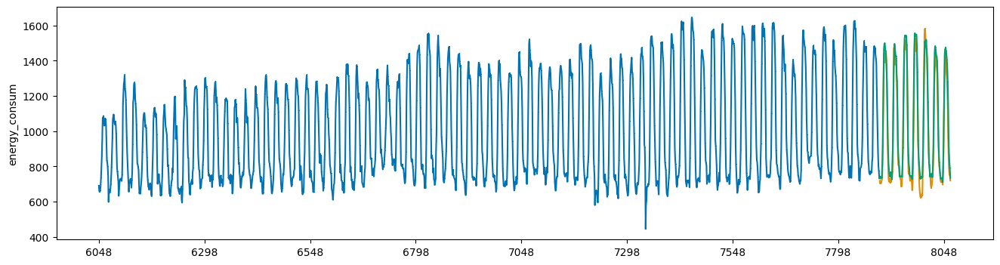

In [ ]:
lgbm_evaluation(train_ft_4, test_ft_4)

## 5

[LightGBM] [Info] Total Bins 1274
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 2730.454478
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[39]	training's l2: 50137.9	training's SMAPE: 2.70979	valid_1's l2: 115753	valid_1's SMAPE: 3.56223
SMAPE_SCORE : 3.5622318502781005
[LightGBM] [Info] Total Bins 1284
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 2754.781961
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005]


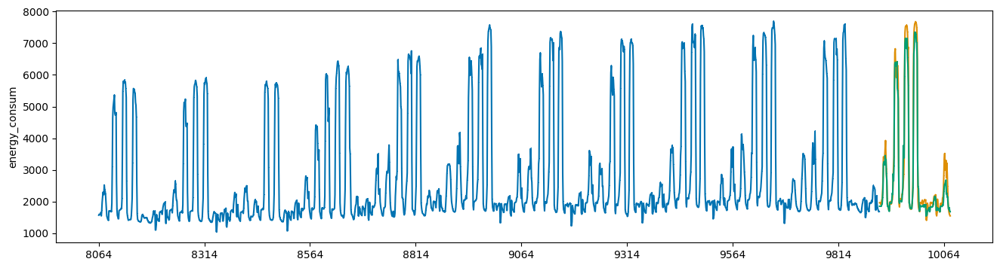

In [ ]:
lgbm_evaluation(train_ft_5, test_ft_5)

## 6

[LightGBM] [Info] Total Bins 1282
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 1968.807793
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[54]	training's l2: 2898.17	training's SMAPE: 1.05956	valid_1's l2: 16603.3	valid_1's SMAPE: 2.08894
SMAPE_SCORE : 2.088941268327012
[LightGBM] [Info] Total Bins 1291
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 1977.859286
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012]


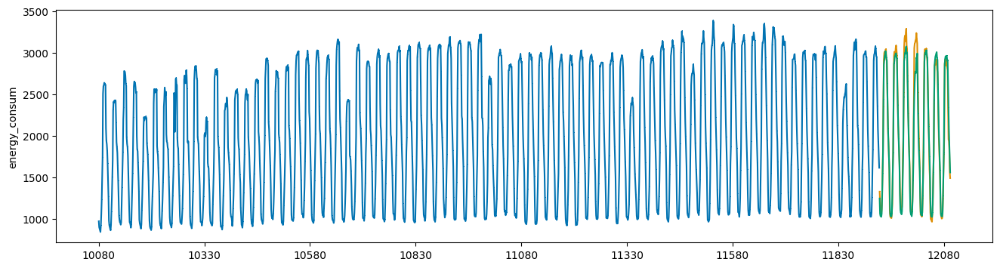

In [ ]:
lgbm_evaluation(train_ft_6, test_ft_6)

## 7

[LightGBM] [Info] Total Bins 1282
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 779.652987
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[89]	training's l2: 981.173	training's SMAPE: 1.55748	valid_1's l2: 6616.08	valid_1's SMAPE: 3.83535
SMAPE_SCORE : 3.8353499022781676
[LightGBM] [Info] Total Bins 1291
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 772.470119
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676]


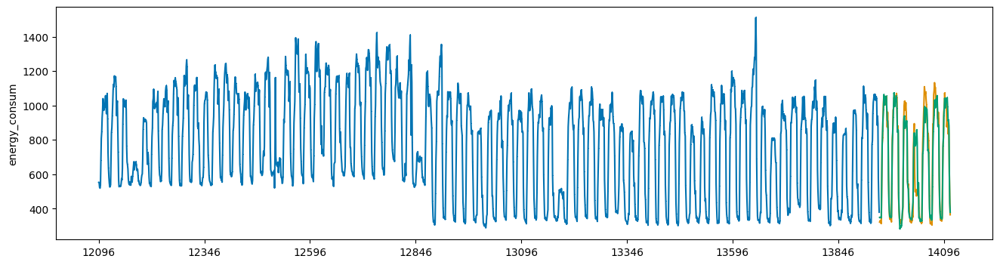

In [ ]:
lgbm_evaluation(train_ft_7, test_ft_7)

## 8

[LightGBM] [Info] Total Bins 1266
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 1326.375715
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[21]	training's l2: 5245.23	training's SMAPE: 2.1083	valid_1's l2: 9357.47	valid_1's SMAPE: 2.74473
SMAPE_SCORE : 2.7447333841069073
[LightGBM] [Info] Total Bins 1277
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 1329.149048
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073]


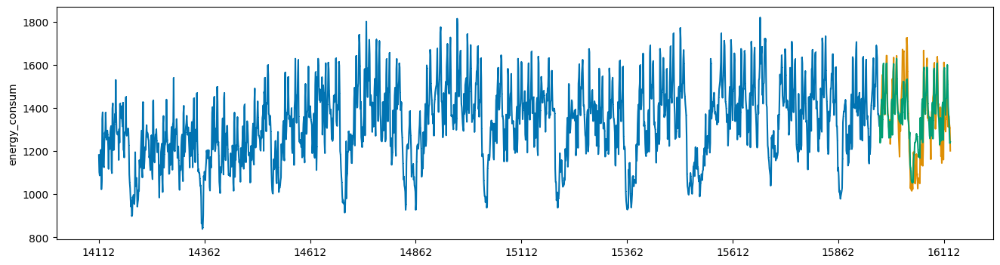

In [ ]:
lgbm_evaluation(train_ft_8, test_ft_8)

## 9

[LightGBM] [Info] Total Bins 1056
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 12
[LightGBM] [Info] Start training from score 2333.697403
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[48]	training's l2: 3828.76	training's SMAPE: 0.995061	valid_1's l2: 10474.3	valid_1's SMAPE: 1.8353
SMAPE_SCORE : 1.8352961294404533
[LightGBM] [Info] Total Bins 1065
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 12
[LightGBM] [Info] Start training from score 2344.274762
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533]


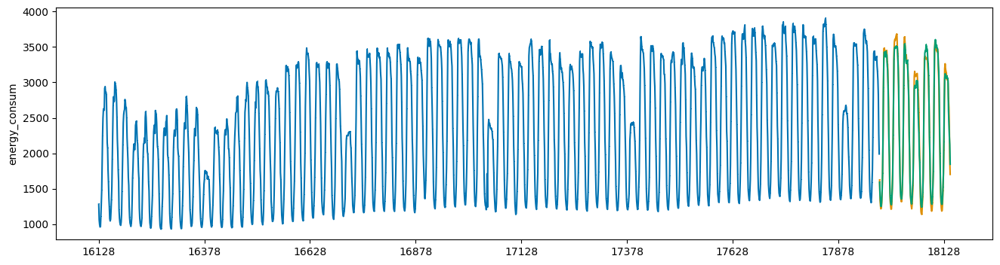

In [ ]:
lgbm_evaluation(train_ft_9, test_ft_9)

## 10

[LightGBM] [Info] Total Bins 1267
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 4064.766363
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[6]	training's l2: 137419	training's SMAPE: 3.74184	valid_1's l2: 189011	valid_1's SMAPE: 4.61529
SMAPE_SCORE : 4.615294244957945
[LightGBM] [Info] Total Bins 1282
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 4062.173927
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945]


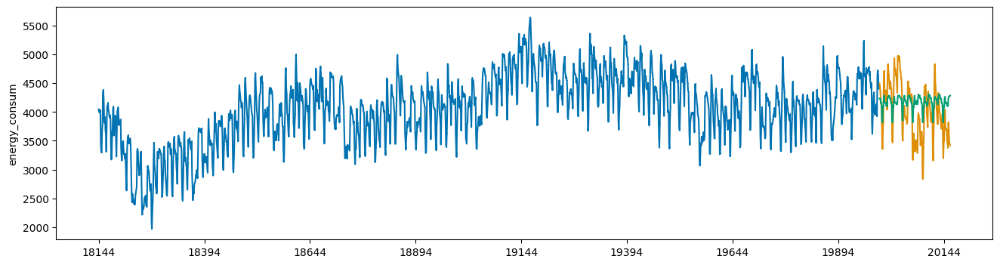

In [ ]:
lgbm_evaluation(train_ft_10, test_ft_10)

## 11

[LightGBM] [Info] Total Bins 1266
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 1932.463247
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[53]	training's l2: 2790.67	training's SMAPE: 0.881197	valid_1's l2: 9080.57	valid_1's SMAPE: 1.7218
SMAPE_SCORE : 1.7217950210635244
[LightGBM] [Info] Total Bins 1277
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 1933.249643
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244]


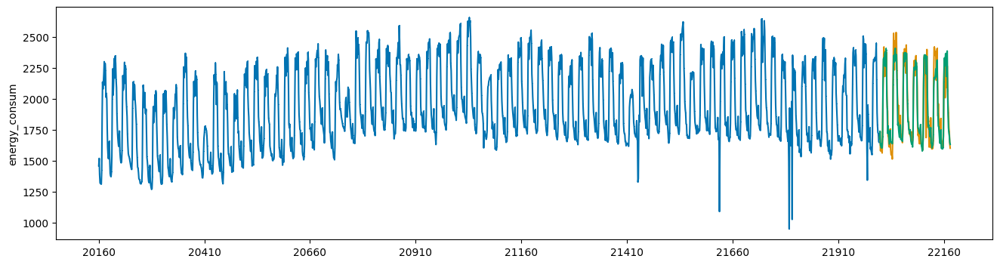

In [ ]:
lgbm_evaluation(train_ft_11, test_ft_11)

## 12

[LightGBM] [Info] Total Bins 1282
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 1438.764740
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[84]	training's l2: 759.6	training's SMAPE: 0.743305	valid_1's l2: 6471.27	valid_1's SMAPE: 1.9417
SMAPE_SCORE : 1.9416968037954694
[LightGBM] [Info] Total Bins 1291
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 1444.928125
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694]


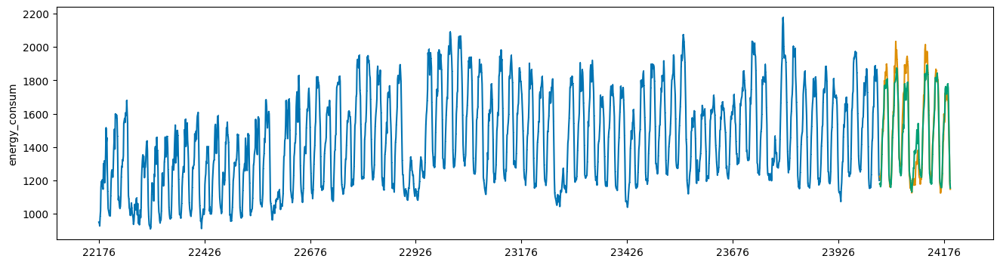

In [ ]:
lgbm_evaluation(train_ft_12, test_ft_12)

## 13

[LightGBM] [Info] Total Bins 1267
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 2531.728442
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[17]	training's l2: 25547.9	training's SMAPE: 2.59799	valid_1's l2: 27283.5	valid_1's SMAPE: 2.60931
SMAPE_SCORE : 2.60930990476679
[LightGBM] [Info] Total Bins 1282
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 2537.385596
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679]


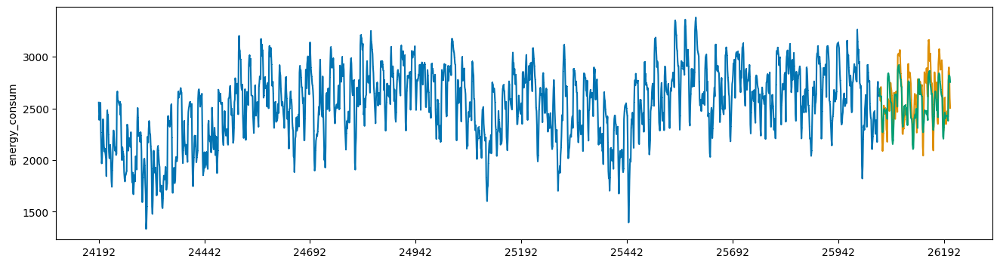

In [ ]:
lgbm_evaluation(train_ft_13, test_ft_13)

## 14

[LightGBM] [Info] Total Bins 1267
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 1913.528310
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[8]	training's l2: 107220	training's SMAPE: 7.4265	valid_1's l2: 136444	valid_1's SMAPE: 8.35211
SMAPE_SCORE : 8.352107999492814
[LightGBM] [Info] Total Bins 1277
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 1907.782380
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814]


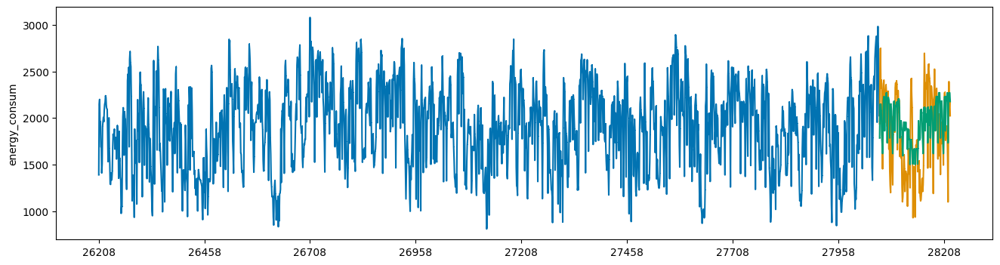

In [ ]:
lgbm_evaluation(train_ft_14, test_ft_14)

## 15

[LightGBM] [Info] Total Bins 1271
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 1782.912369
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[27]	training's l2: 3951.55	training's SMAPE: 1.36909	valid_1's l2: 7381.65	valid_1's SMAPE: 1.87039
SMAPE_SCORE : 1.8703864648084705
[LightGBM] [Info] Total Bins 1286
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 1782.149241
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705]


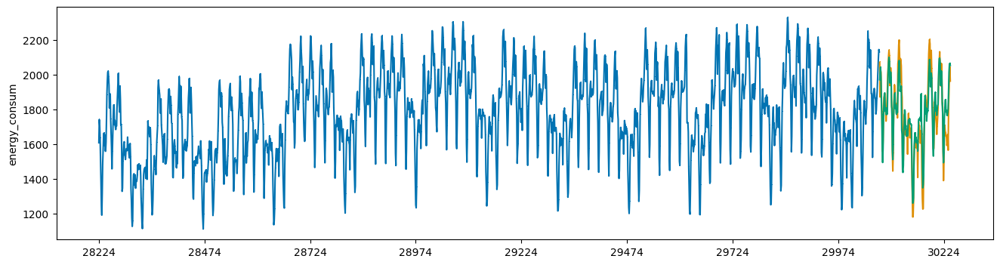

In [ ]:
lgbm_evaluation(train_ft_15, test_ft_15)

## 16

[LightGBM] [Info] Total Bins 1239
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 3406.021042
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[22]	training's l2: 45769.8	training's SMAPE: 3.55859	valid_1's l2: 40213.7	valid_1's SMAPE: 2.97472
SMAPE_SCORE : 2.9747165182759012
[LightGBM] [Info] Total Bins 1252
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 3414.361193
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012]


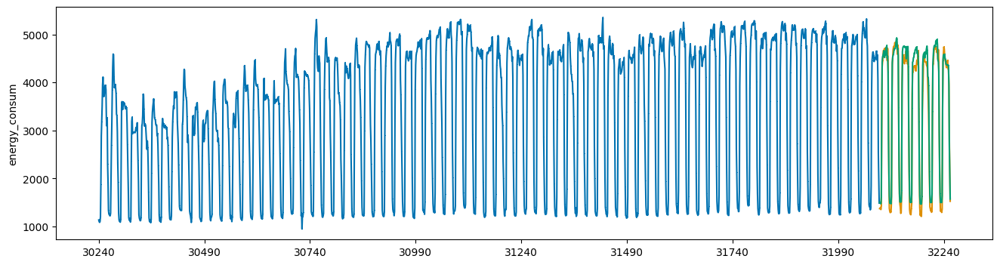

In [ ]:
lgbm_evaluation(train_ft_16, test_ft_16)

## 17

[LightGBM] [Info] Total Bins 1274
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 978.219886
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[45]	training's l2: 2511.5	training's SMAPE: 1.79309	valid_1's l2: 11997.3	valid_1's SMAPE: 3.33858
SMAPE_SCORE : 3.338581739055377
[LightGBM] [Info] Total Bins 1284
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 982.527812
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377]


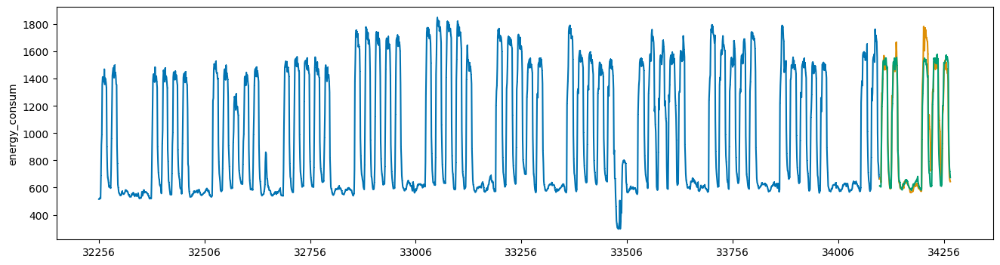

In [ ]:
lgbm_evaluation(train_ft_17, test_ft_17)

## 18

[LightGBM] [Info] Total Bins 1282
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 1449.849270
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[51]	training's l2: 3057.2	training's SMAPE: 1.32784	valid_1's l2: 24828.1	valid_1's SMAPE: 3.59378
SMAPE_SCORE : 3.5937803353432907
[LightGBM] [Info] Total Bins 1291
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 1460.628497
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907]


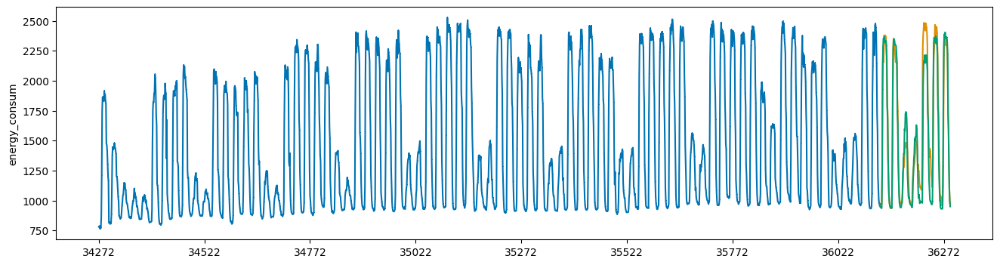

In [ ]:
lgbm_evaluation(train_ft_18, test_ft_18)

## 19

[LightGBM] [Info] Total Bins 1274
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 1420.082085
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[86]	training's l2: 1500.44	training's SMAPE: 1.0023	valid_1's l2: 41755.6	valid_1's SMAPE: 4.70017
SMAPE_SCORE : 4.700170557309832
[LightGBM] [Info] Total Bins 1284
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 1430.264054
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832]


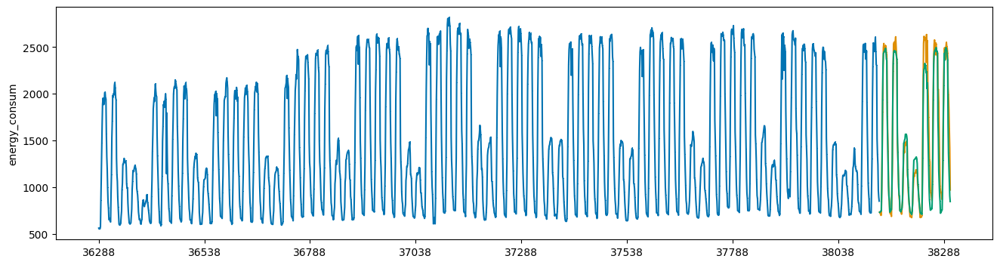

In [ ]:
lgbm_evaluation(train_ft_19, test_ft_19)

## 20

[LightGBM] [Info] Total Bins 1254
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 1724.482339
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[36]	training's l2: 13378	training's SMAPE: 2.09752	valid_1's l2: 49427.2	valid_1's SMAPE: 3.489
SMAPE_SCORE : 3.489000966985488
[LightGBM] [Info] Total Bins 1264
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 1732.892382
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488]


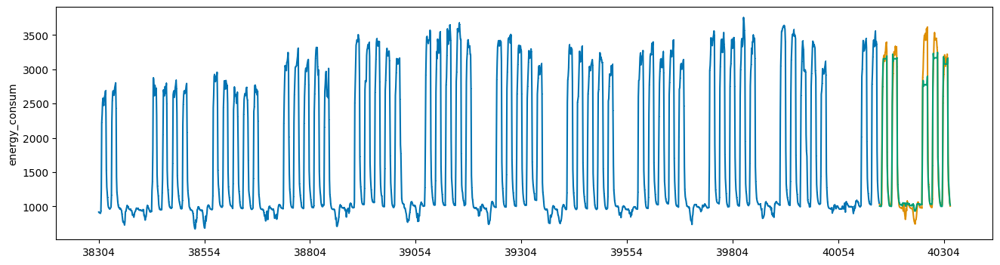

In [ ]:
lgbm_evaluation(train_ft_20, test_ft_20)

## 21

[LightGBM] [Info] Total Bins 1257
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 1987.589499
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[38]	training's l2: 12096.8	training's SMAPE: 1.95467	valid_1's l2: 49707.6	valid_1's SMAPE: 4.19271
SMAPE_SCORE : 4.192710887187649
[LightGBM] [Info] Total Bins 1267
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 1995.378887
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 4

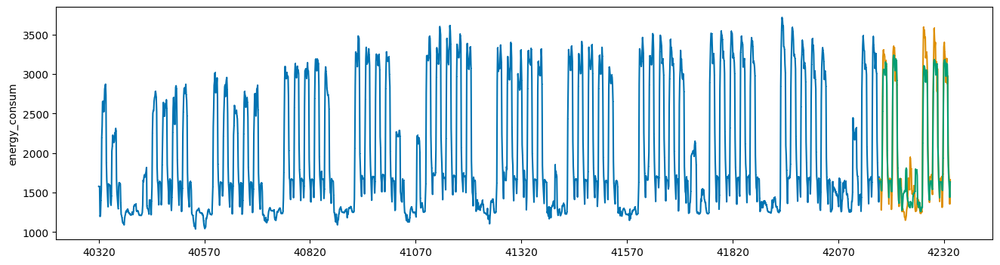

In [ ]:
lgbm_evaluation(train_ft_21, test_ft_21)

## 22

[LightGBM] [Info] Total Bins 1257
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 1236.076949
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[34]	training's l2: 2327.21	training's SMAPE: 1.39049	valid_1's l2: 5815.9	valid_1's SMAPE: 1.97169
SMAPE_SCORE : 1.9716879906416371
[LightGBM] [Info] Total Bins 1268
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 1237.861250
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 4

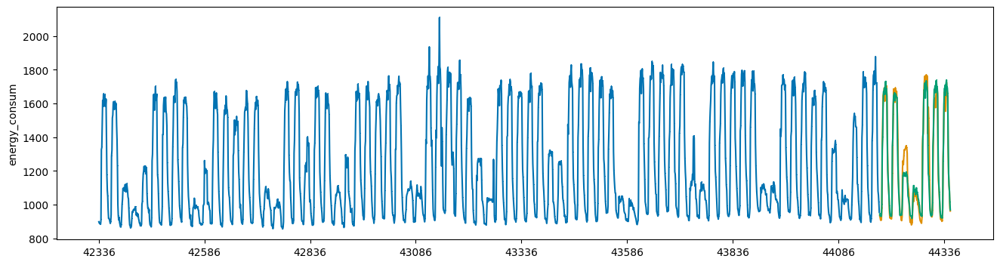

In [ ]:
lgbm_evaluation(train_ft_22, test_ft_22)

## 23

[LightGBM] [Info] Total Bins 1240
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 1264.469319
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[53]	training's l2: 489.188	training's SMAPE: 0.52495	valid_1's l2: 3142	valid_1's SMAPE: 1.04193
SMAPE_SCORE : 1.0419286004382835
[LightGBM] [Info] Total Bins 1253
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 1267.254167
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 4.1

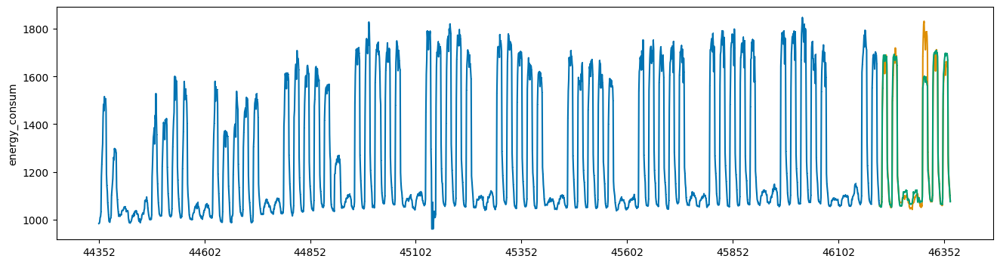

In [ ]:
lgbm_evaluation(train_ft_23, test_ft_23)

## 24

[LightGBM] [Info] Total Bins 1274
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 10046.908445
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[94]	training's l2: 20858.7	training's SMAPE: 0.535263	valid_1's l2: 110801	valid_1's SMAPE: 1.13022
SMAPE_SCORE : 1.1302154978079852
[LightGBM] [Info] Total Bins 1284
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 10079.341967
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488

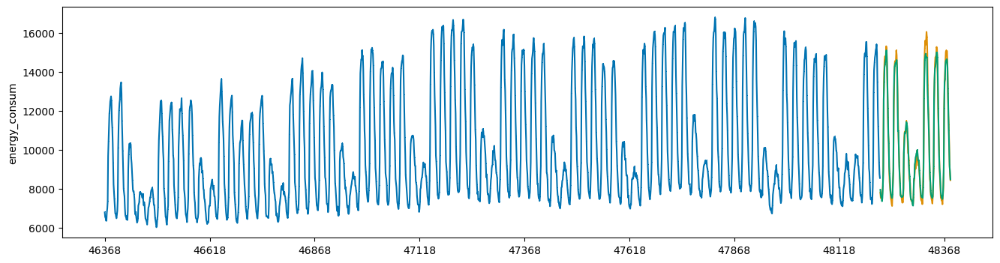

In [ ]:
lgbm_evaluation(train_ft_24, test_ft_24)

## 25

[LightGBM] [Info] Total Bins 1274
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 7265.609476
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[54]	training's l2: 31801	training's SMAPE: 0.784805	valid_1's l2: 103260	valid_1's SMAPE: 1.36575
SMAPE_SCORE : 1.3657453561472752
[LightGBM] [Info] Total Bins 1284
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 7288.983864
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 4.

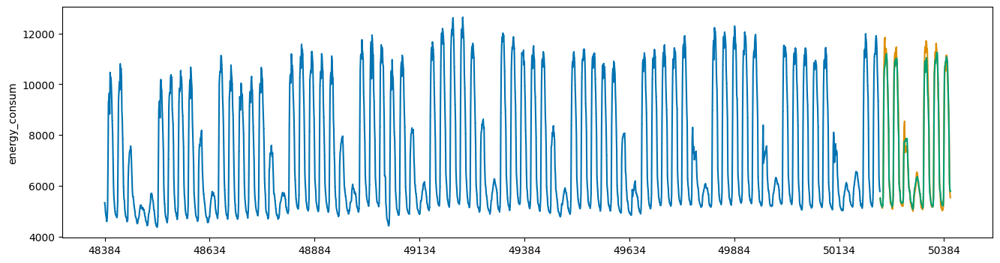

In [ ]:
lgbm_evaluation(train_ft_25, test_ft_25)

## 26

[LightGBM] [Info] Total Bins 1282
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 3536.451428
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[33]	training's l2: 16807.1	training's SMAPE: 1.20084	valid_1's l2: 29271.7	valid_1's SMAPE: 1.41301
SMAPE_SCORE : 1.4130088587966299
[LightGBM] [Info] Total Bins 1290
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 3540.765476
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 

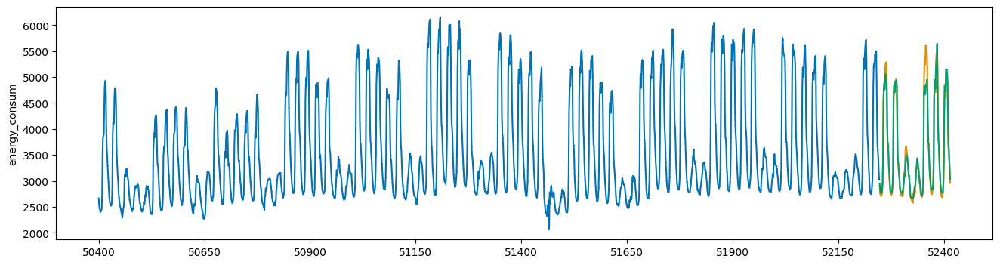

In [ ]:
lgbm_evaluation(train_ft_26, test_ft_26)

## 27

[LightGBM] [Info] Total Bins 1272
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 17479.325746
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[37]	training's l2: 126163	training's SMAPE: 0.673225	valid_1's l2: 585114	valid_1's SMAPE: 1.44906
SMAPE_SCORE : 1.449061960294012
[LightGBM] [Info] Total Bins 1282
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 17501.216653
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 

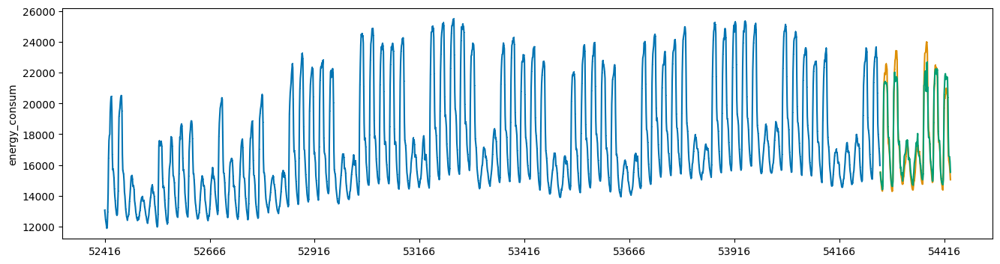

In [ ]:
lgbm_evaluation(train_ft_27, test_ft_27)

## 28

[LightGBM] [Info] Total Bins 1247
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 1741.411169
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[40]	training's l2: 6313.86	training's SMAPE: 1.52339	valid_1's l2: 11469.6	valid_1's SMAPE: 2.53163
SMAPE_SCORE : 2.5316273348914864
[LightGBM] [Info] Total Bins 1261
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 1733.818750
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 

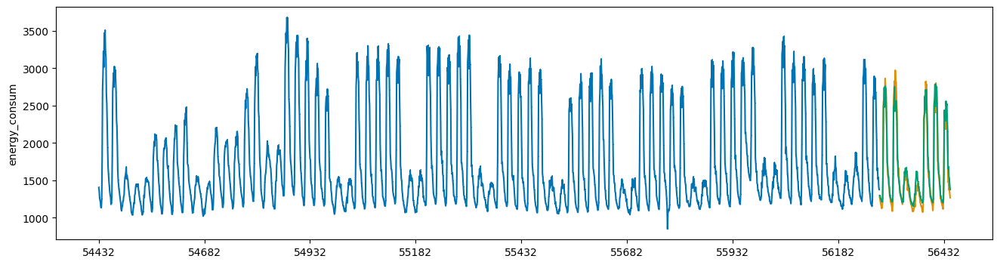

In [ ]:
lgbm_evaluation(train_ft_28, test_ft_28)

## 29

[LightGBM] [Info] Total Bins 1252
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 1455.595374
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[46]	training's l2: 2096.53	training's SMAPE: 1.12048	valid_1's l2: 14727.8	valid_1's SMAPE: 2.71642
SMAPE_SCORE : 2.7164173966587124
[LightGBM] [Info] Total Bins 1262
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 1454.552307
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 

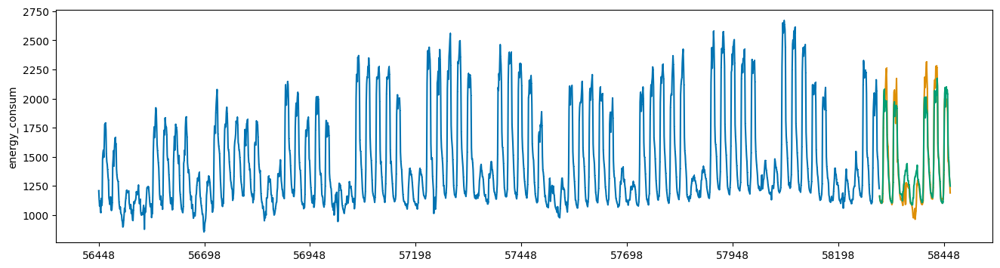

In [ ]:
lgbm_evaluation(train_ft_29, test_ft_29)

## 30

[LightGBM] [Info] Total Bins 1263
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 843.738393
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[97]	training's l2: 899.403	training's SMAPE: 1.36236	valid_1's l2: 12085.8	valid_1's SMAPE: 4.42767
SMAPE_SCORE : 4.427673900954027
[LightGBM] [Info] Total Bins 1272
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 845.154837
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 4.1

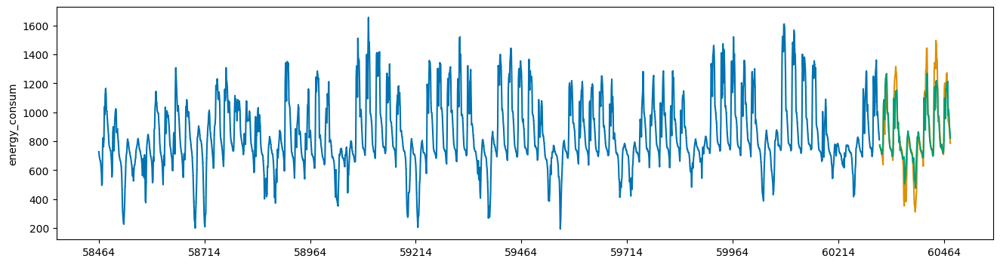

In [ ]:
lgbm_evaluation(train_ft_30, test_ft_30)

## 31

[LightGBM] [Info] Total Bins 1255
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 1363.991005
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[23]	training's l2: 6409.94	training's SMAPE: 2.16031	valid_1's l2: 9881.69	valid_1's SMAPE: 3.23537
SMAPE_SCORE : 3.235367872239117
[LightGBM] [Info] Total Bins 1269
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 1358.770088
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 4

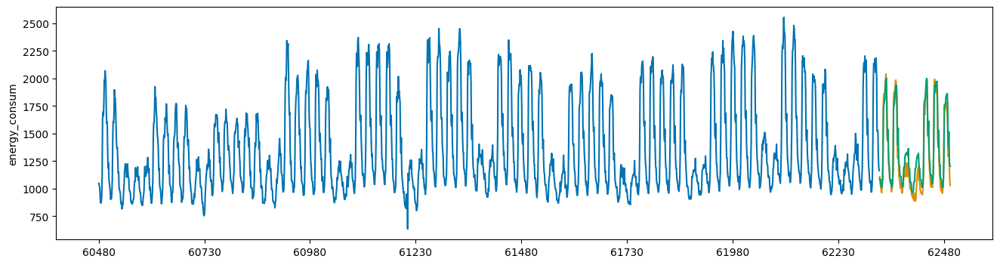

In [ ]:
lgbm_evaluation(train_ft_31, test_ft_31)

## 32

[LightGBM] [Info] Total Bins 1270
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 9871.341222
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[82]	training's l2: 320.273	training's SMAPE: 0.0686596	valid_1's l2: 4028.82	valid_1's SMAPE: 0.251267
SMAPE_SCORE : 0.25126706332971466
[LightGBM] [Info] Total Bins 1279
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 9872.854094
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.4890009669854

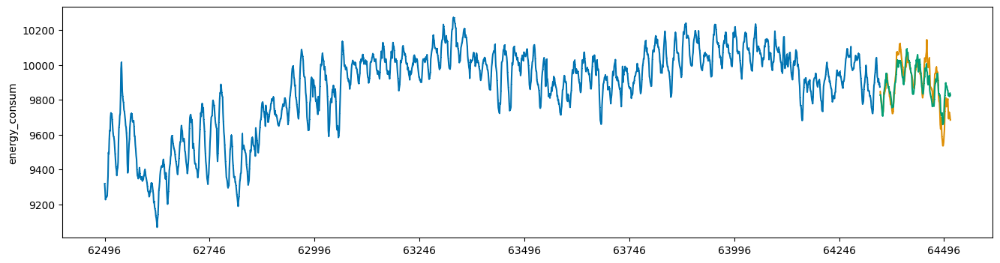

In [ ]:
lgbm_evaluation(train_ft_32, test_ft_32)

## 33

[LightGBM] [Info] Total Bins 1274
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 8699.036486
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[73]	training's l2: 289.457	training's SMAPE: 0.0712227	valid_1's l2: 1068.54	valid_1's SMAPE: 0.146648
SMAPE_SCORE : 0.14664815528453862
[LightGBM] [Info] Total Bins 1284
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 8705.436427
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.4890009669854

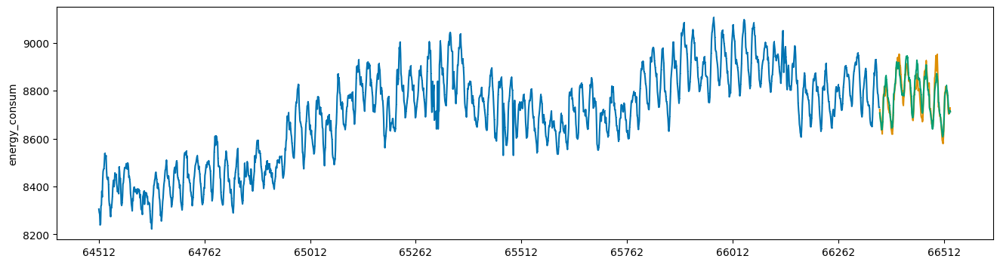

In [ ]:
lgbm_evaluation(train_ft_33, test_ft_33)

## 34

[LightGBM] [Info] Total Bins 1274
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 3353.344285
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[30]	training's l2: 582.552	training's SMAPE: 0.217231	valid_1's l2: 686.382	valid_1's SMAPE: 0.312062
SMAPE_SCORE : 0.31206177792667616
[LightGBM] [Info] Total Bins 1284
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 3355.337678
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.48900096698548

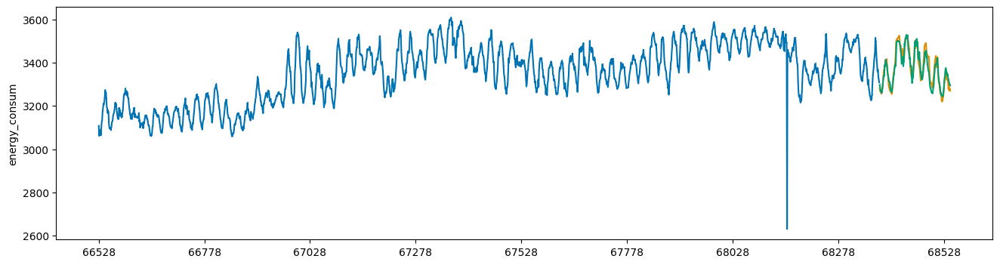

In [ ]:
lgbm_evaluation(train_ft_34, test_ft_34)

## 35

[LightGBM] [Info] Total Bins 1274
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 2172.606819
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[45]	training's l2: 48.0439	training's SMAPE: 0.115397	valid_1's l2: 150.524	valid_1's SMAPE: 0.234136
SMAPE_SCORE : 0.23413590022054778
[LightGBM] [Info] Total Bins 1284
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 2173.522917
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.48900096698548

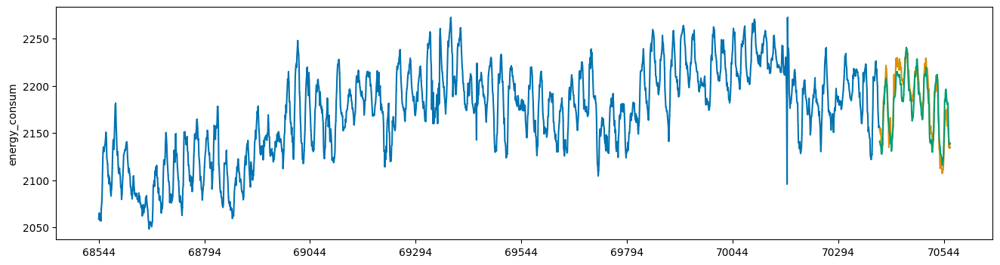

In [ ]:
lgbm_evaluation(train_ft_35, test_ft_35)

## 36

[LightGBM] [Info] Total Bins 1282
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 2893.058246
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[100]	training's l2: 40.7412	training's SMAPE: 0.0869362	valid_1's l2: 255.275	valid_1's SMAPE: 0.200844
SMAPE_SCORE : 0.20084424598714587
[LightGBM] [Info] Total Bins 1291
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 2893.374107
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985

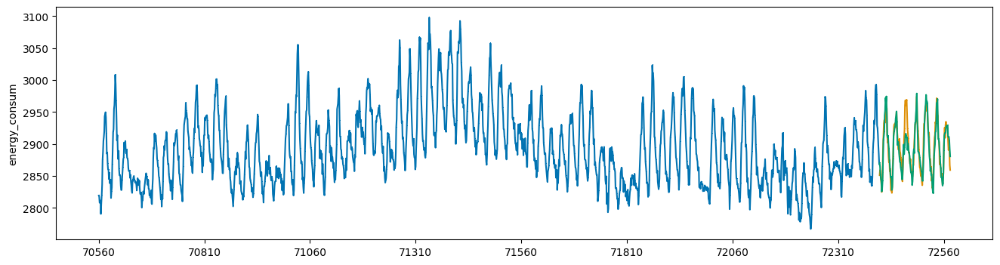

In [ ]:
lgbm_evaluation(train_ft_36, test_ft_36)

## 37

[LightGBM] [Info] Total Bins 1270
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 3347.322238
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[34]	training's l2: 38528.3	training's SMAPE: 2.4434	valid_1's l2: 69920.2	valid_1's SMAPE: 2.23514
SMAPE_SCORE : 2.235135119397334
[LightGBM] [Info] Total Bins 1279
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 3357.473956
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 4.

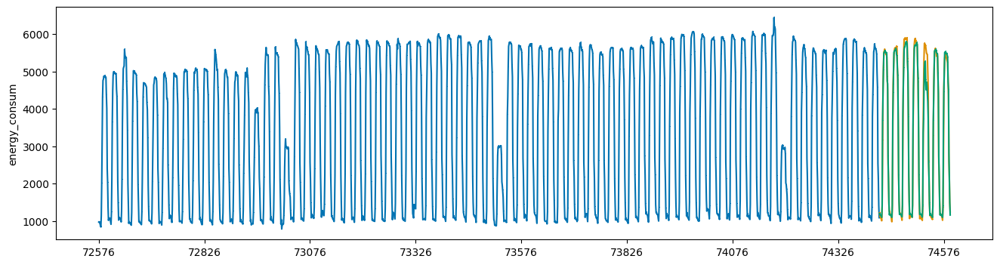

In [ ]:
lgbm_evaluation(train_ft_37, test_ft_37)

## 38

[LightGBM] [Info] Total Bins 1365
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 1807.772727
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[59]	training's l2: 4093.71	training's SMAPE: 1.45201	valid_1's l2: 11740.5	valid_1's SMAPE: 1.98567
SMAPE_SCORE : 1.9856725940298814
[LightGBM] [Info] Total Bins 1374
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 1814.066072
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 

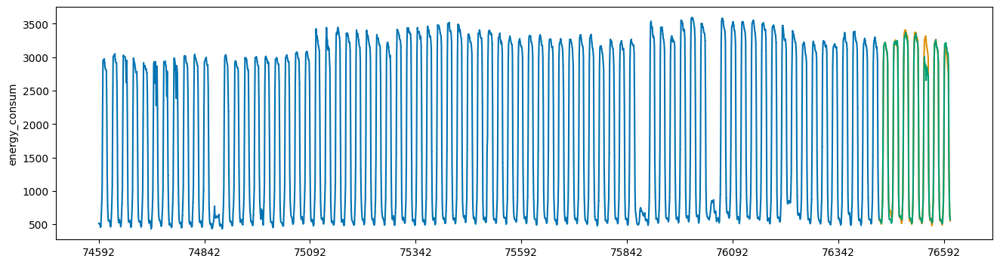

In [ ]:
lgbm_evaluation(train_ft_38, test_ft_38)

## 39

[LightGBM] [Info] Total Bins 1271
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 2166.333767
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[98]	training's l2: 2473.45	training's SMAPE: 1.12866	valid_1's l2: 51580.5	valid_1's SMAPE: 3.74189
SMAPE_SCORE : 3.741893842694129
[LightGBM] [Info] Total Bins 1281
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 2172.330954
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 4

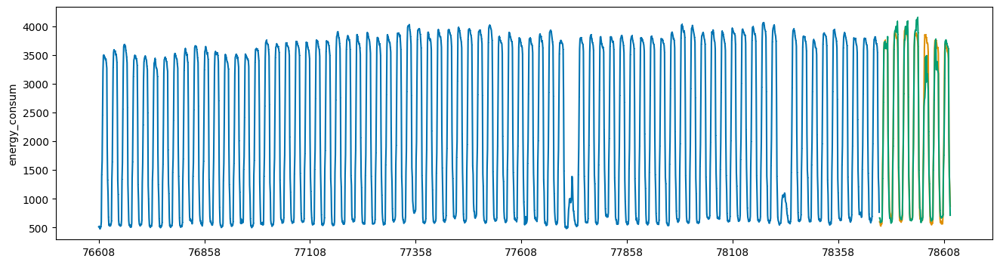

In [ ]:
lgbm_evaluation(train_ft_39, test_ft_39)

## 40

[LightGBM] [Info] Total Bins 1246
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 1878.314774
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[22]	training's l2: 65664.4	training's SMAPE: 8.02873	valid_1's l2: 85735.3	valid_1's SMAPE: 6.20245
SMAPE_SCORE : 6.202453881144814
[LightGBM] [Info] Total Bins 1257
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 1889.157293
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 4

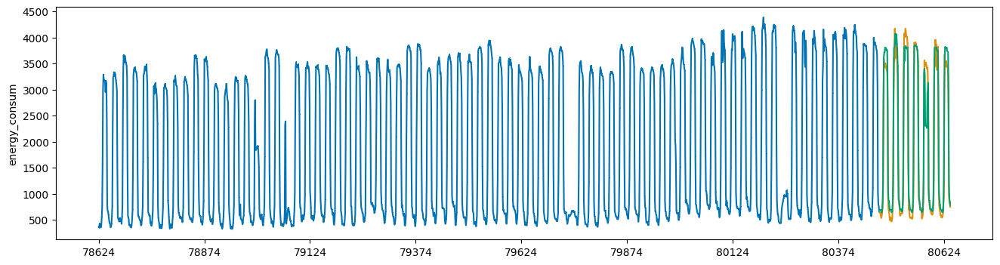

In [ ]:
lgbm_evaluation(train_ft_40, test_ft_40)

## 41

[LightGBM] [Info] Total Bins 1274
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 3255.086202
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[39]	training's l2: 29709.4	training's SMAPE: 2.19608	valid_1's l2: 31339.8	valid_1's SMAPE: 2.28803
SMAPE_SCORE : 2.2880250261468196
[LightGBM] [Info] Total Bins 1284
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 3272.762351
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 

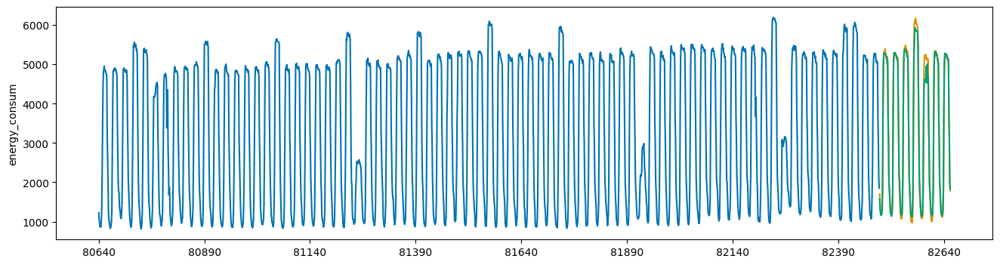

In [ ]:
lgbm_evaluation(train_ft_41, test_ft_41)

## 42

[LightGBM] [Info] Total Bins 1466
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 1604.826817
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[50]	training's l2: 5049.87	training's SMAPE: 1.61097	valid_1's l2: 260267	valid_1's SMAPE: 5.68975
SMAPE_SCORE : 5.6897483558064375
[LightGBM] [Info] Total Bins 1474
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 1597.826964
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 4

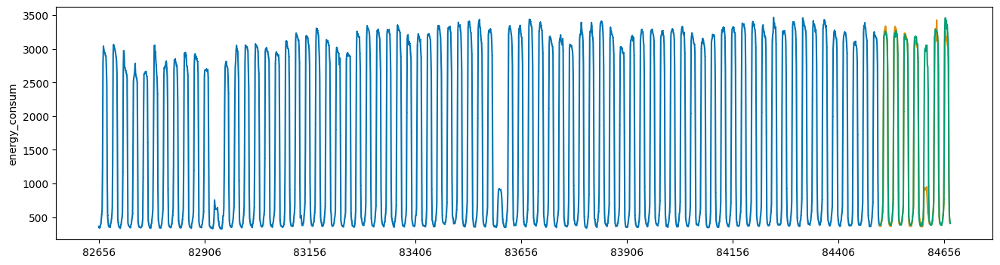

In [ ]:
lgbm_evaluation(train_ft_42, test_ft_42)

## 43

[LightGBM] [Info] Total Bins 1257
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 1889.464939
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[49]	training's l2: 2841.1	training's SMAPE: 1.96757	valid_1's l2: 5790.89	valid_1's SMAPE: 2.38102
SMAPE_SCORE : 2.3810172679363935
[LightGBM] [Info] Total Bins 1268
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 1897.245837
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 4

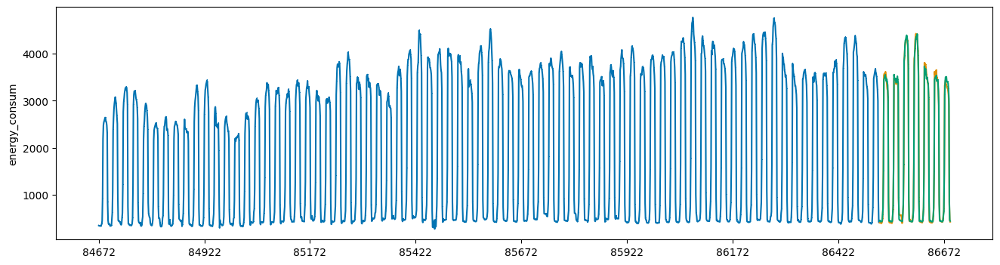

In [ ]:
lgbm_evaluation(train_ft_43, test_ft_43)

## 44

[LightGBM] [Info] Total Bins 1257
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 2125.560260
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[31]	training's l2: 6770.34	training's SMAPE: 3.02953	valid_1's l2: 9556.96	valid_1's SMAPE: 3.36696
SMAPE_SCORE : 3.3669568852799245
[LightGBM] [Info] Total Bins 1268
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 2129.255239
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 

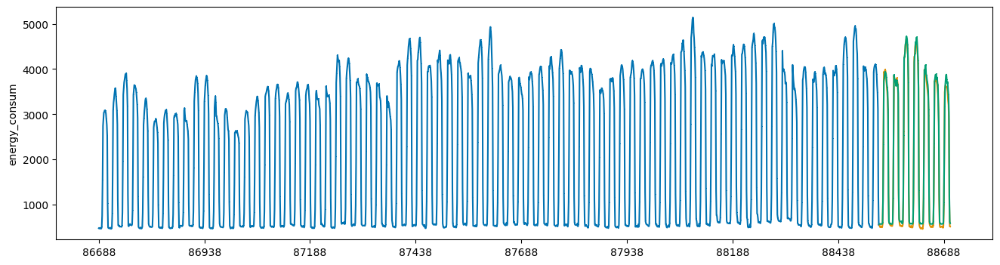

In [ ]:
lgbm_evaluation(train_ft_44, test_ft_44)

## 45

In [ ]:
train_ft_45.head()

,energy_consum,building_num,temp,precip,wind,hum,day,month,week,day_of_year,sin_time,cos_time,THI,feels_temp,CDH,hour_mean
88704,1967.52,45,18.1,0.0,0.4,67.0,3,6,22,153,0.000000,1.000000,63.38573,22.524968,-22.2,2345.782857
88705,1945.92,45,17.6,0.0,0.8,69.0,3,6,22,153,0.258819,0.965926,62.71156,21.949295,-32.9,2353.571429
88706,1918.08,45,17.2,0.0,0.7,71.0,3,6,22,153,0.500000,0.866025,62.16888,21.493024,-44.1,2332.194286
88707,1906.08,45,17.2,0.0,2.2,75.0,3,6,22,153,0.707107,0.707107,62.27800,21.561793,-55.2,2302.645714
88708,1941.60,45,17.2,0.0,2.0,81.0,3,6,22,153,0.866025,0.500000,62.44168,21.653550,-65.6,2376.562857


[LightGBM] [Info] Total Bins 1270
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 2949.231167
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[51]	training's l2: 3562.57	training's SMAPE: 0.794021	valid_1's l2: 6516.23	valid_1's SMAPE: 1.00149
SMAPE_SCORE : 1.0014948063691207
[LightGBM] [Info] Total Bins 1279
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 2960.537141
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488,

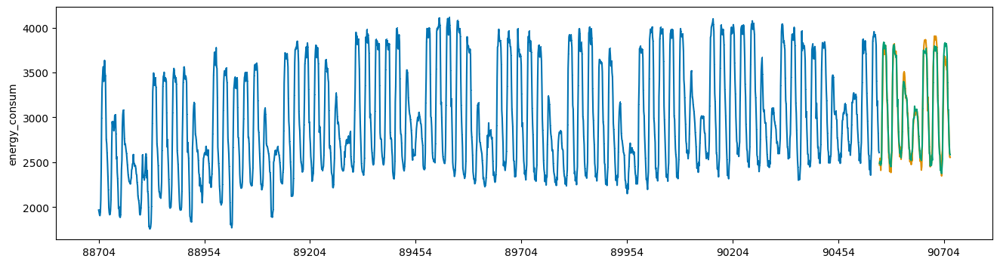

In [ ]:
lgbm_evaluation(train_ft_45, test_ft_45)

## 46

[LightGBM] [Info] Total Bins 1251
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 2250.247792
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[34]	training's l2: 7693.86	training's SMAPE: 1.58299	valid_1's l2: 29303.9	valid_1's SMAPE: 2.69997
SMAPE_SCORE : 2.699966431828518
[LightGBM] [Info] Total Bins 1261
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 2258.839286
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 4

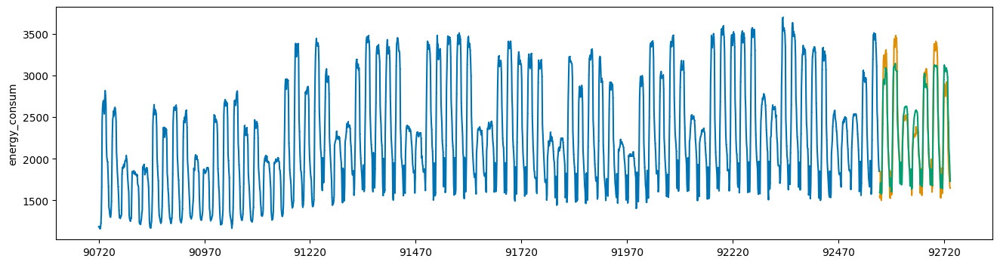

In [ ]:
lgbm_evaluation(train_ft_46, test_ft_46)

## 47

[LightGBM] [Info] Total Bins 1282
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 5387.977272
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[41]	training's l2: 17079.1	training's SMAPE: 0.98005	valid_1's l2: 83140.4	valid_1's SMAPE: 2.1676
SMAPE_SCORE : 2.1676047219829817
[LightGBM] [Info] Total Bins 1291
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 5391.546070
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 4

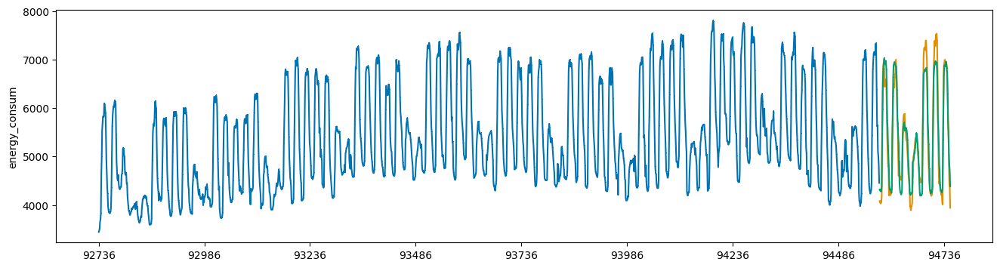

In [ ]:
lgbm_evaluation(train_ft_47, test_ft_47)

## 48

[LightGBM] [Info] Total Bins 1246
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 1883.103702
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[71]	training's l2: 732.263	training's SMAPE: 0.553021	valid_1's l2: 4004.48	valid_1's SMAPE: 1.23279
SMAPE_SCORE : 1.232791434091647
[LightGBM] [Info] Total Bins 1257
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 1890.170358
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 

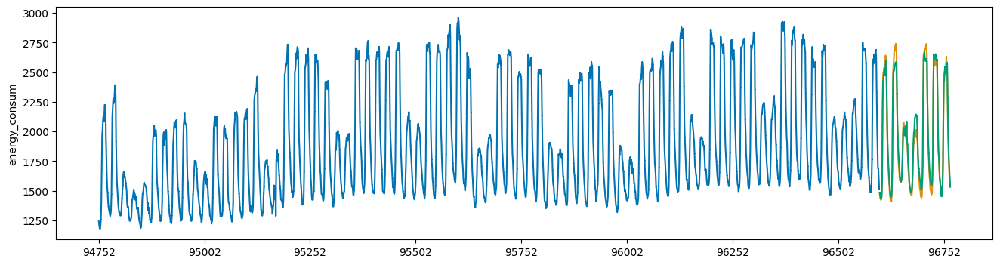

In [ ]:
lgbm_evaluation(train_ft_48, test_ft_48)

## 49

[LightGBM] [Info] Total Bins 1246
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 3046.460846
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[60]	training's l2: 1811.35	training's SMAPE: 0.536449	valid_1's l2: 7509.7	valid_1's SMAPE: 1.07835
SMAPE_SCORE : 1.078346132713009
[LightGBM] [Info] Total Bins 1257
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 3063.804644
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 4

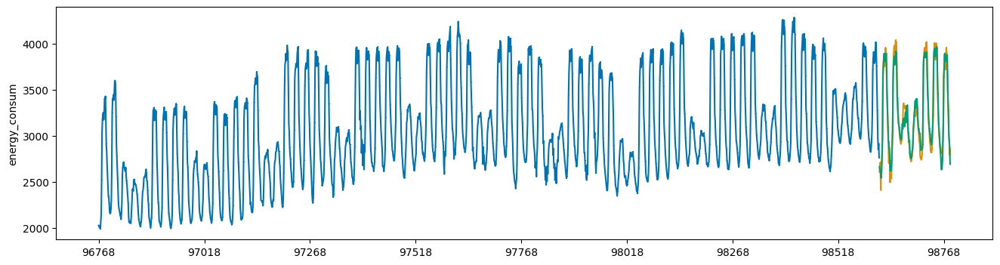

In [ ]:
lgbm_evaluation(train_ft_49, test_ft_49)

## 50

[LightGBM] [Info] Total Bins 1249
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 3032.765745
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[33]	training's l2: 4478.93	training's SMAPE: 0.877565	valid_1's l2: 11800.6	valid_1's SMAPE: 1.45063
SMAPE_SCORE : 1.4506251898893632
[LightGBM] [Info] Total Bins 1259
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 3039.537945
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488,

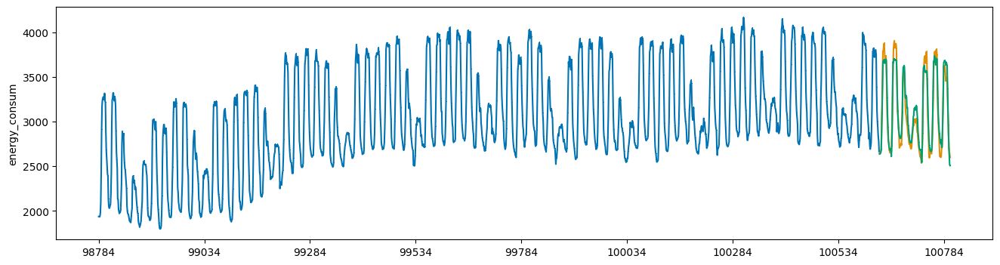

In [ ]:
lgbm_evaluation(train_ft_50, test_ft_50)

## 51

[LightGBM] [Info] Total Bins 1270
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 2644.687694
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[66]	training's l2: 2988.51	training's SMAPE: 0.83256	valid_1's l2: 16169.1	valid_1's SMAPE: 1.71207
SMAPE_SCORE : 1.7120696151385026
[LightGBM] [Info] Total Bins 1285
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 2649.473839
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 

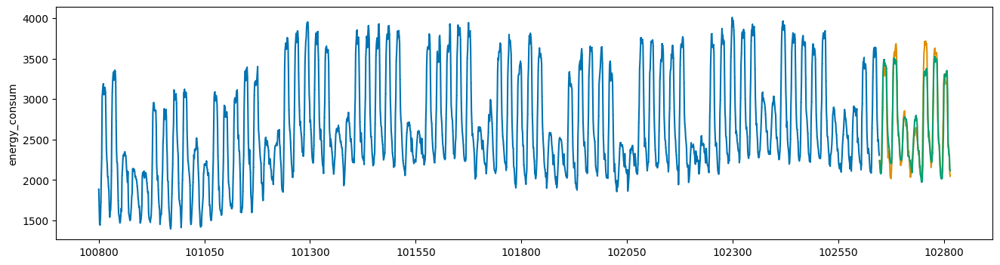

In [ ]:
lgbm_evaluation(train_ft_51, test_ft_51)

## 52

[LightGBM] [Info] Total Bins 1276
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 2104.479707
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[56]	training's l2: 3488.86	training's SMAPE: 1.09517	valid_1's l2: 14169.8	valid_1's SMAPE: 1.80283
SMAPE_SCORE : 1.8028257882871528
[LightGBM] [Info] Total Bins 1285
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 2117.802232
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 

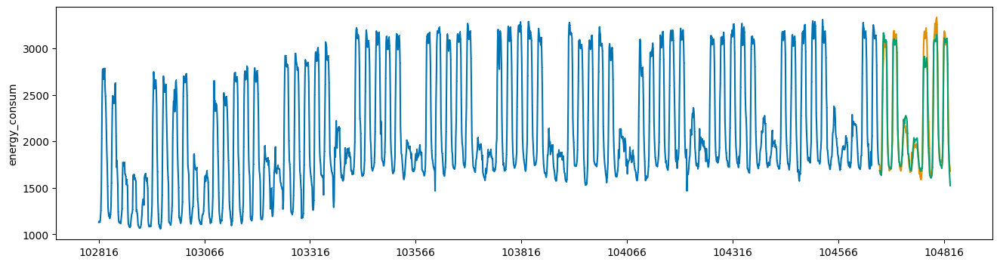

In [ ]:
lgbm_evaluation(train_ft_52, test_ft_52)

## 53

[LightGBM] [Info] Total Bins 1274
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 2013.000649
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[28]	training's l2: 36097.9	training's SMAPE: 4.69148	valid_1's l2: 82182.1	valid_1's SMAPE: 7.64348
SMAPE_SCORE : 7.643478352944208
[LightGBM] [Info] Total Bins 1284
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 2019.136071
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 4

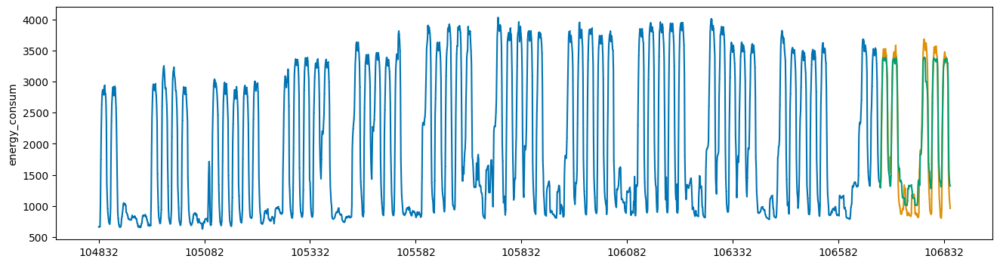

In [ ]:
lgbm_evaluation(train_ft_53, test_ft_53)

## 54

[LightGBM] [Info] Total Bins 1236
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 13
[LightGBM] [Info] Start training from score 1809.974514
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[10]	training's l2: 180054	training's SMAPE: 14.4916	valid_1's l2: 653408	valid_1's SMAPE: 16.9729
SMAPE_SCORE : 16.9729020865342
[LightGBM] [Info] Total Bins 1249
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 13
[LightGBM] [Info] Start training from score 1826.438483
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 4.19

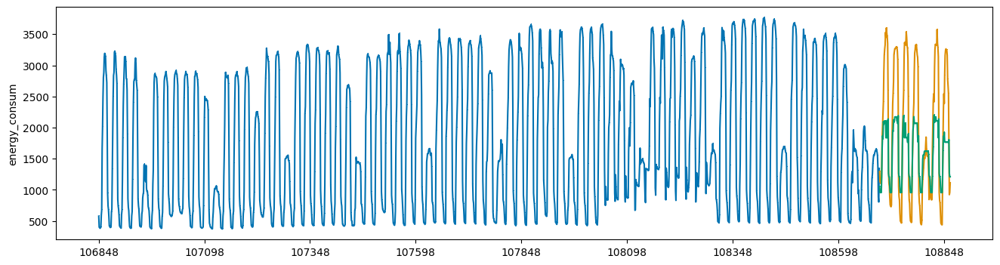

In [ ]:
lgbm_evaluation(train_ft_54, test_ft_54)

## 55

[LightGBM] [Info] Total Bins 1246
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 1009.629157
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[43]	training's l2: 122.256	training's SMAPE: 0.394431	valid_1's l2: 466.163	valid_1's SMAPE: 0.783103
SMAPE_SCORE : 0.7831026200069237
[LightGBM] [Info] Total Bins 1257
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 1010.339048
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488

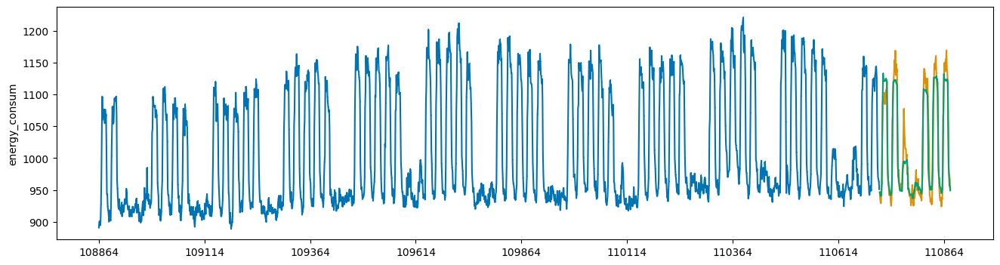

In [ ]:
lgbm_evaluation(train_ft_55, test_ft_55)

## 56

[LightGBM] [Info] Total Bins 1272
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 4173.144935
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[56]	training's l2: 1340.1	training's SMAPE: 0.187804	valid_1's l2: 2171.66	valid_1's SMAPE: 0.463468
SMAPE_SCORE : 0.4634684880830065
[LightGBM] [Info] Total Bins 1282
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 4172.646607
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488,

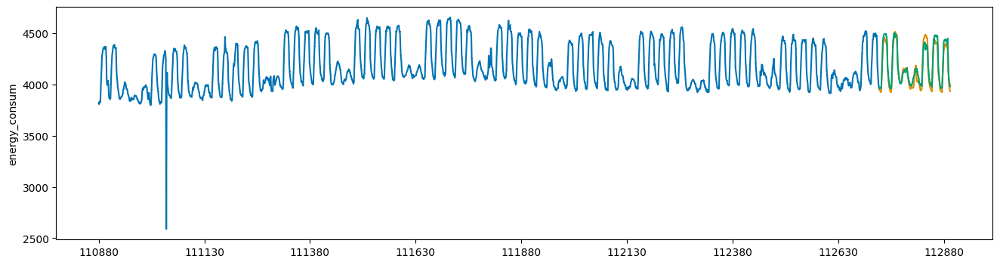

In [ ]:
lgbm_evaluation(train_ft_56, test_ft_56)

## 57

[LightGBM] [Info] Total Bins 1274
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 1905.730810
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[41]	training's l2: 6787.96	training's SMAPE: 1.93157	valid_1's l2: 11445.7	valid_1's SMAPE: 2.45891
SMAPE_SCORE : 2.4589079982961475
[LightGBM] [Info] Total Bins 1284
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 1912.423302
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 

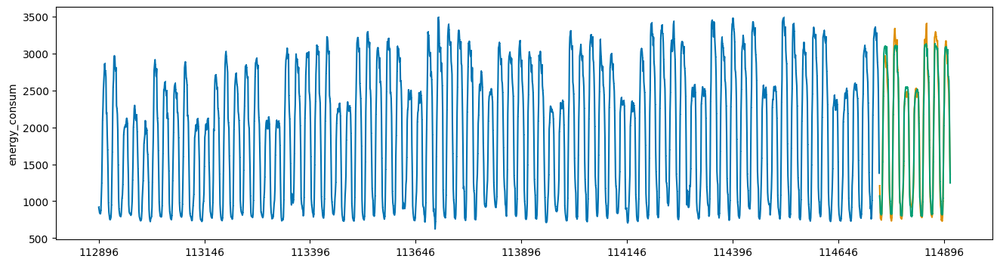

In [ ]:
lgbm_evaluation(train_ft_57, test_ft_57)

## 58

[LightGBM] [Info] Total Bins 1282
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 2881.721557
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[57]	training's l2: 141.68	training's SMAPE: 0.144544	valid_1's l2: 245.535	valid_1's SMAPE: 0.220924
SMAPE_SCORE : 0.22092426031817236
[LightGBM] [Info] Total Bins 1291
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 2883.900236
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488

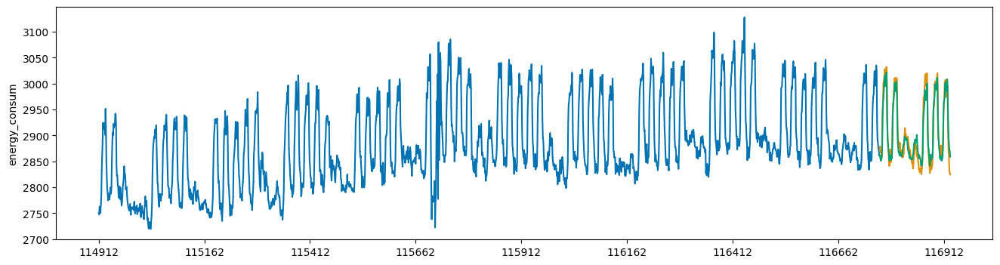

In [ ]:
lgbm_evaluation(train_ft_58, test_ft_58)

## 59

[LightGBM] [Info] Total Bins 1274
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 1664.450941
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[39]	training's l2: 14673.9	training's SMAPE: 2.57717	valid_1's l2: 23473.1	valid_1's SMAPE: 3.48987
SMAPE_SCORE : 3.4898658869119346
[LightGBM] [Info] Total Bins 1284
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 1668.882411
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 

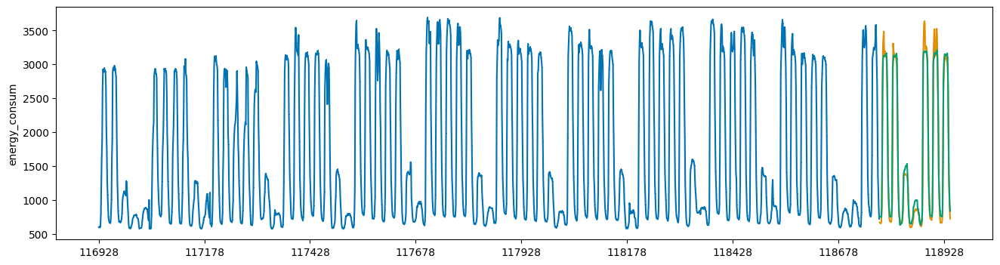

In [ ]:
lgbm_evaluation(train_ft_59, test_ft_59)

## 60

[LightGBM] [Info] Total Bins 1270
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 2945.192987
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[41]	training's l2: 15565.2	training's SMAPE: 1.61287	valid_1's l2: 43791	valid_1's SMAPE: 2.64752
SMAPE_SCORE : 2.6475157946429486
[LightGBM] [Info] Total Bins 1279
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 2952.853333
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 4.

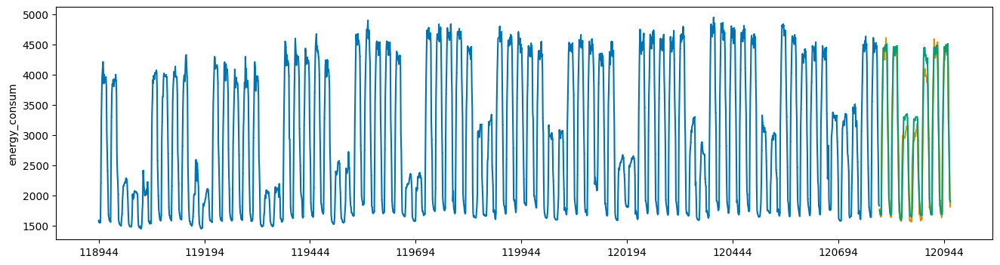

In [ ]:
lgbm_evaluation(train_ft_60, test_ft_60)

## 61

[LightGBM] [Info] Total Bins 1274
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 3114.364284
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[80]	training's l2: 5815.01	training's SMAPE: 0.855942	valid_1's l2: 44449.9	valid_1's SMAPE: 2.18104
SMAPE_SCORE : 2.1810439532704913
[LightGBM] [Info] Total Bins 1284
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 3119.994283
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488,

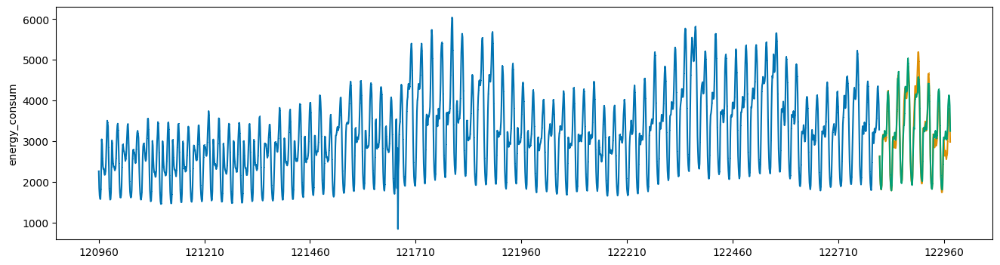

In [ ]:
lgbm_evaluation(train_ft_61, test_ft_61)

## 62

[LightGBM] [Info] Total Bins 1274
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 1148.152014
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[78]	training's l2: 583.553	training's SMAPE: 0.813749	valid_1's l2: 6478.5	valid_1's SMAPE: 2.45659
SMAPE_SCORE : 2.4565920974605477
[LightGBM] [Info] Total Bins 1284
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 1150.902054
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 

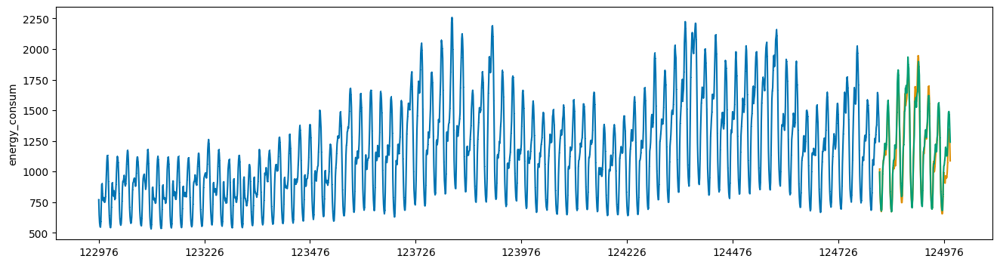

In [ ]:
lgbm_evaluation(train_ft_62, test_ft_62)

## 63

[LightGBM] [Info] Total Bins 1271
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 755.362792
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[99]	training's l2: 247.643	training's SMAPE: 0.813879	valid_1's l2: 2546.37	valid_1's SMAPE: 2.62801
SMAPE_SCORE : 2.6280141254863625
[LightGBM] [Info] Total Bins 1281
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 755.476875
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 4

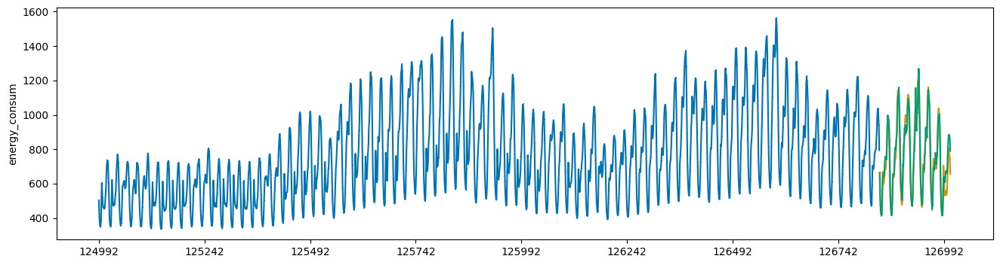

In [ ]:
lgbm_evaluation(train_ft_63, test_ft_63)

## 64

[LightGBM] [Info] Total Bins 1267
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 1183.853474
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[32]	training's l2: 1760.22	training's SMAPE: 1.3623	valid_1's l2: 4177.44	valid_1's SMAPE: 2.20503
SMAPE_SCORE : 2.205027447532554
[LightGBM] [Info] Total Bins 1277
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 1186.642947
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 4.

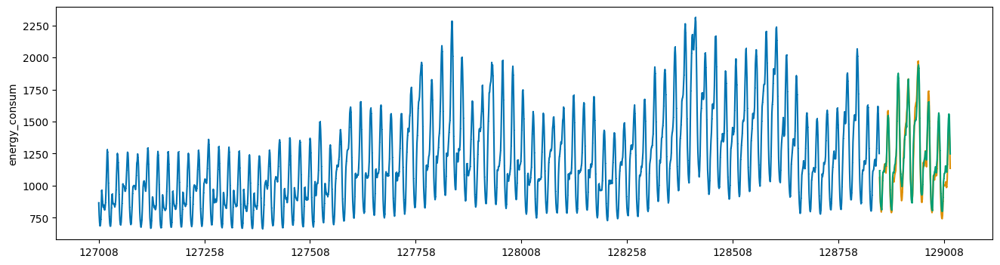

In [ ]:
lgbm_evaluation(train_ft_64, test_ft_64)

## 65

[LightGBM] [Info] Total Bins 1246
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 569.951786
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[100]	training's l2: 712.369	training's SMAPE: 1.63427	valid_1's l2: 6236.26	valid_1's SMAPE: 4.89606
SMAPE_SCORE : 4.8960563496274085
[LightGBM] [Info] Total Bins 1257
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 577.095179
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 4

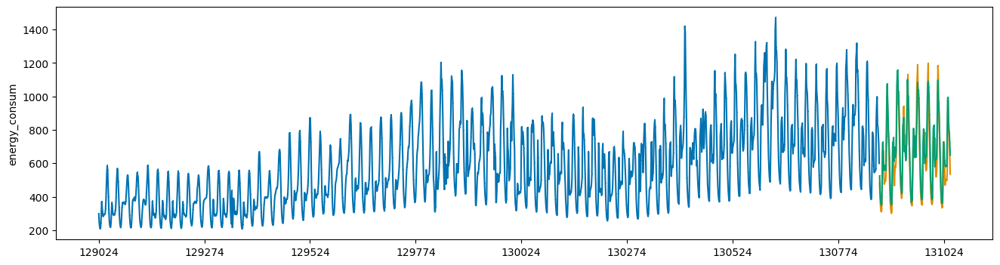

In [ ]:
lgbm_evaluation(train_ft_65, test_ft_65)

## 66

[LightGBM] [Info] Total Bins 1240
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 397.512273
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[100]	training's l2: 35.2008	training's SMAPE: 0.567585	valid_1's l2: 356.644	valid_1's SMAPE: 1.73772
SMAPE_SCORE : 1.7377232431056981
[LightGBM] [Info] Total Bins 1253
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 398.520714
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 

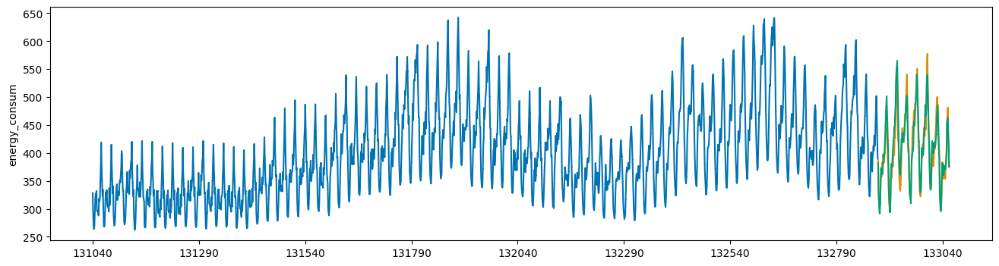

In [ ]:
lgbm_evaluation(train_ft_66, test_ft_66)

## 67

[LightGBM] [Info] Total Bins 1270
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 1286.403052
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[66]	training's l2: 824.044	training's SMAPE: 0.857869	valid_1's l2: 16297.6	valid_1's SMAPE: 4.05941
SMAPE_SCORE : 4.05940637820775
[LightGBM] [Info] Total Bins 1286
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 1283.149464
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 4

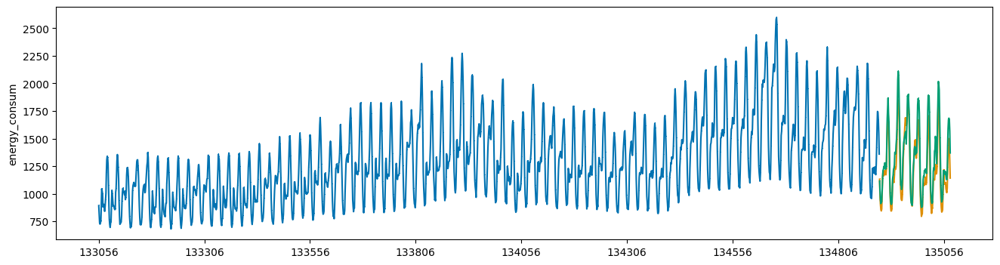

In [ ]:
lgbm_evaluation(train_ft_67, test_ft_67)

## 68

[LightGBM] [Info] Total Bins 1274
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 2026.578084
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[100]	training's l2: 1269.52	training's SMAPE: 0.657254	valid_1's l2: 11427.9	valid_1's SMAPE: 1.98379
SMAPE_SCORE : 1.983787939042174
[LightGBM] [Info] Total Bins 1284
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 2028.030803
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488,

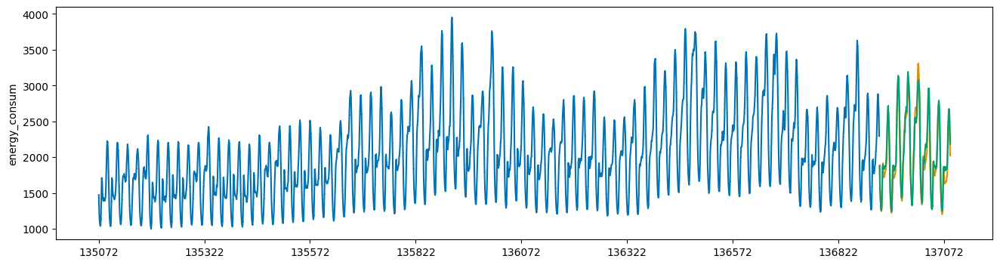

In [ ]:
lgbm_evaluation(train_ft_68, test_ft_68)

## 69

[LightGBM] [Info] Total Bins 1274
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 4497.610064
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[34]	training's l2: 27035.5	training's SMAPE: 1.05454	valid_1's l2: 44700	valid_1's SMAPE: 1.60311
SMAPE_SCORE : 1.6031064865483198
[LightGBM] [Info] Total Bins 1284
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 4505.322172
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 4.

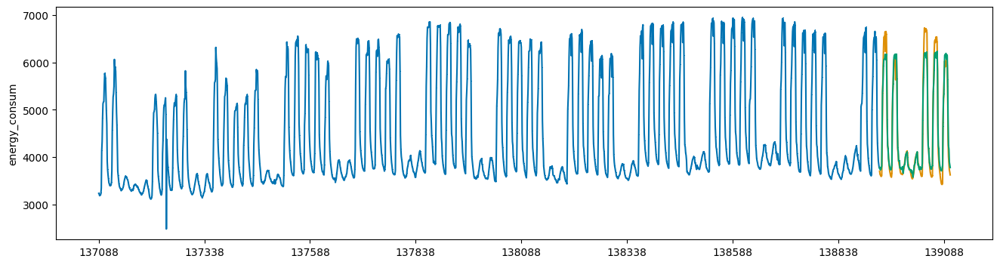

In [ ]:
lgbm_evaluation(train_ft_69, test_ft_69)

## 70

[LightGBM] [Info] Total Bins 1271
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 4284.730983
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[52]	training's l2: 17405.1	training's SMAPE: 1.13244	valid_1's l2: 132045	valid_1's SMAPE: 2.10246
SMAPE_SCORE : 2.102462384458265
[LightGBM] [Info] Total Bins 1281
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 4303.824794
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 4.

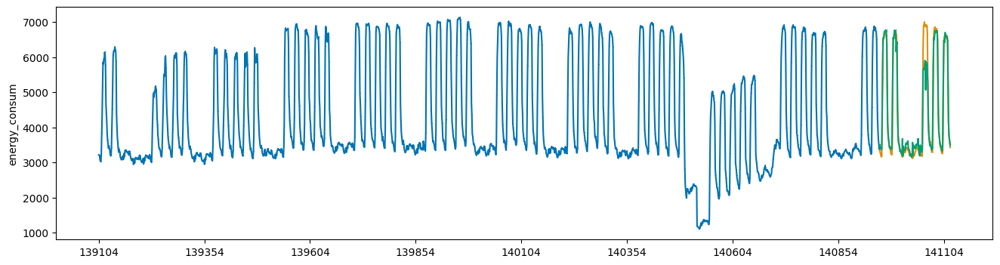

In [ ]:
lgbm_evaluation(train_ft_70, test_ft_70)

## 71

[LightGBM] [Info] Total Bins 1271
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 2140.239353
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[34]	training's l2: 11410.8	training's SMAPE: 1.64653	valid_1's l2: 16021.5	valid_1's SMAPE: 1.9427
SMAPE_SCORE : 1.9427036903776864
[LightGBM] [Info] Total Bins 1281
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 2150.689288
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 4

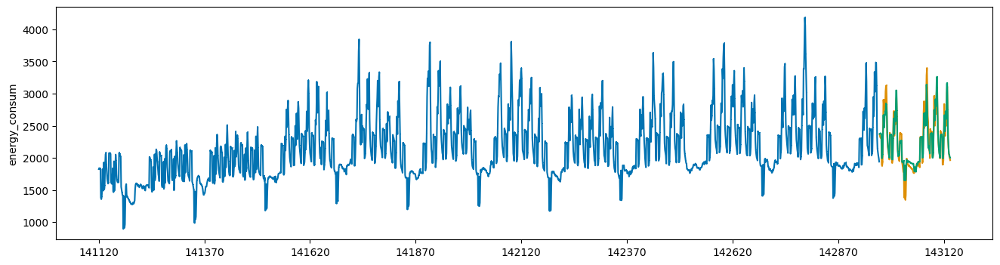

In [ ]:
lgbm_evaluation(train_ft_71, test_ft_71)

## 72

[LightGBM] [Info] Total Bins 1218
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 13
[LightGBM] [Info] Start training from score 1272.046657
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[45]	training's l2: 603.895	training's SMAPE: 0.669301	valid_1's l2: 8306.4	valid_1's SMAPE: 2.83086
SMAPE_SCORE : 2.830861497273171
[LightGBM] [Info] Total Bins 1226
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 13
[LightGBM] [Info] Start training from score 1281.908305
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 4

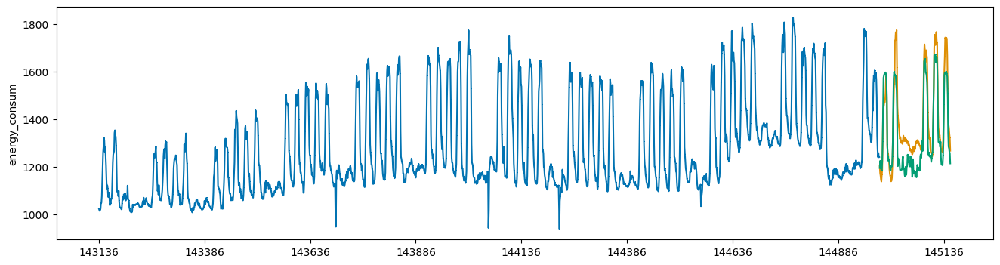

In [ ]:
lgbm_evaluation(train_ft_72, test_ft_72)

## 73

[LightGBM] [Info] Total Bins 1282
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 3628.169088
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[31]	training's l2: 7985.62	training's SMAPE: 0.973647	valid_1's l2: 30418.3	valid_1's SMAPE: 1.88141
SMAPE_SCORE : 1.8814076588403488
[LightGBM] [Info] Total Bins 1291
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 3641.660950
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488,

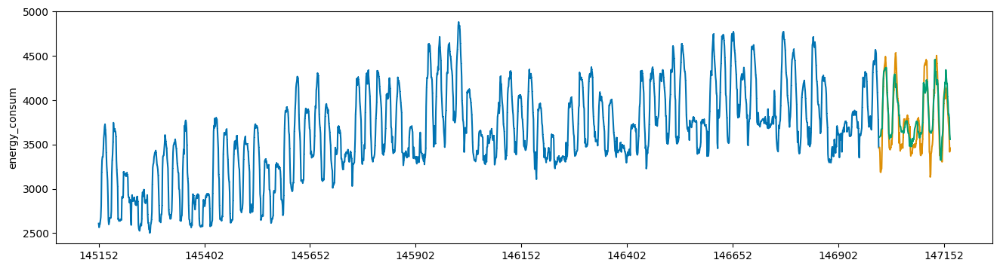

In [ ]:
lgbm_evaluation(train_ft_73, test_ft_73)

## 74

[LightGBM] [Info] Total Bins 1274
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 4023.035461
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[47]	training's l2: 32900.8	training's SMAPE: 1.62597	valid_1's l2: 198733	valid_1's SMAPE: 3.4675
SMAPE_SCORE : 3.4675046031501107
[LightGBM] [Info] Total Bins 1284
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 4047.360720
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 4.

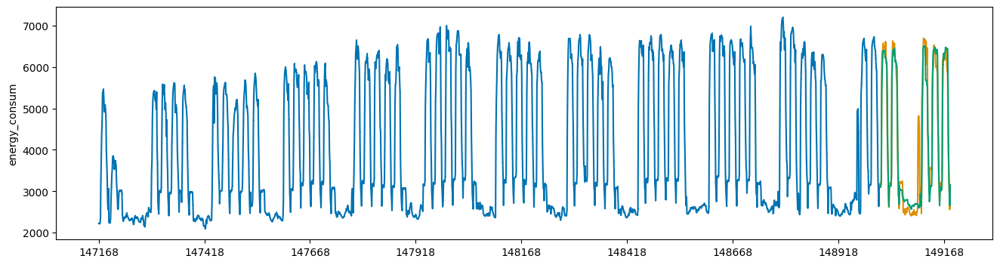

In [ ]:
lgbm_evaluation(train_ft_74, test_ft_74)

## 75

[LightGBM] [Info] Total Bins 1235
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 1406.505649
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[53]	training's l2: 4914.45	training's SMAPE: 1.69437	valid_1's l2: 7159.24	valid_1's SMAPE: 2.07549
SMAPE_SCORE : 2.0754851460264563
[LightGBM] [Info] Total Bins 1245
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 1410.518511
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 

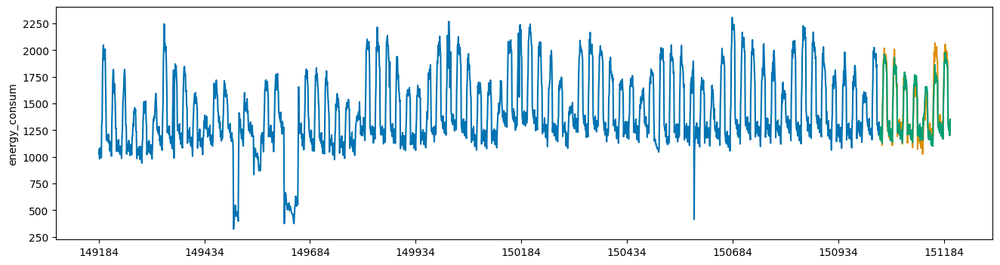

In [ ]:
lgbm_evaluation(train_ft_75, test_ft_75)

## 76

[LightGBM] [Info] Total Bins 1245
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 1198.982339
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[34]	training's l2: 1997.1	training's SMAPE: 1.41411	valid_1's l2: 4733.15	valid_1's SMAPE: 2.1654
SMAPE_SCORE : 2.1653960020840093
[LightGBM] [Info] Total Bins 1257
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 1204.154019
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 4.

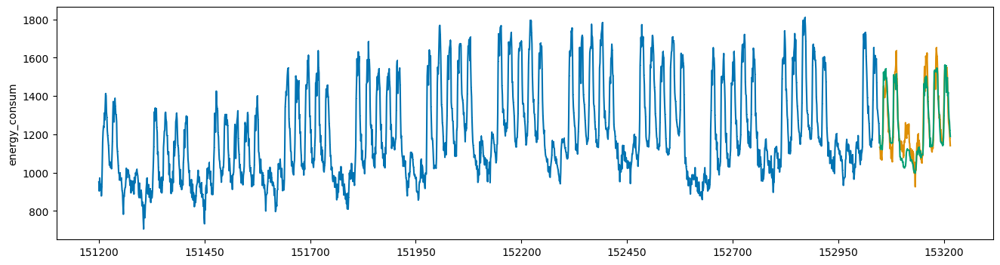

In [ ]:
lgbm_evaluation(train_ft_76, test_ft_76)

## 77

[LightGBM] [Info] Total Bins 1282
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 1486.338508
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[60]	training's l2: 1294.74	training's SMAPE: 0.95019	valid_1's l2: 8442.25	valid_1's SMAPE: 2.01662
SMAPE_SCORE : 2.016619003006134
[LightGBM] [Info] Total Bins 1291
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 1490.198573
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 4

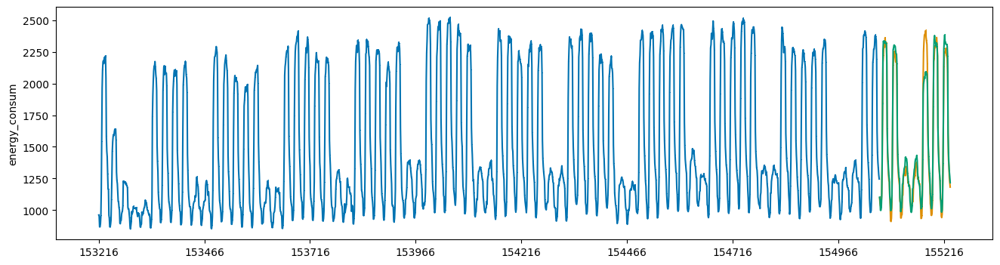

In [ ]:
lgbm_evaluation(train_ft_77, test_ft_77)

## 78

[LightGBM] [Info] Total Bins 1282
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 1648.529479
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[41]	training's l2: 4819.2	training's SMAPE: 1.23234	valid_1's l2: 15319.9	valid_1's SMAPE: 1.87759
SMAPE_SCORE : 1.877586613784888
[LightGBM] [Info] Total Bins 1291
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 1657.119165
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 4.

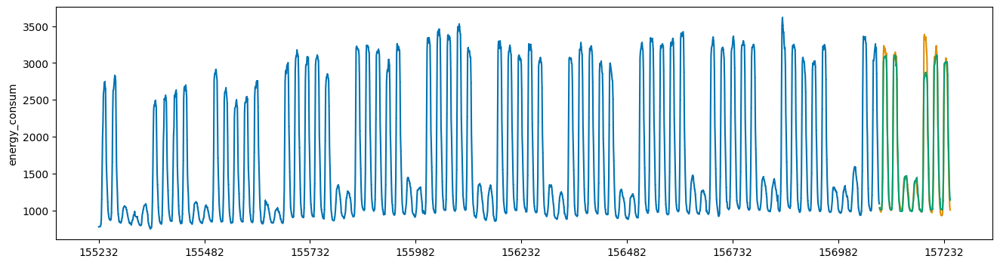

In [ ]:
lgbm_evaluation(train_ft_78, test_ft_78)

## 79

[LightGBM] [Info] Total Bins 1277
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 2894.813893
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[59]	training's l2: 3924.11	training's SMAPE: 0.829066	valid_1's l2: 32073.7	valid_1's SMAPE: 1.86753
SMAPE_SCORE : 1.8675347729374694
[LightGBM] [Info] Total Bins 1287
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 2903.851069
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488,

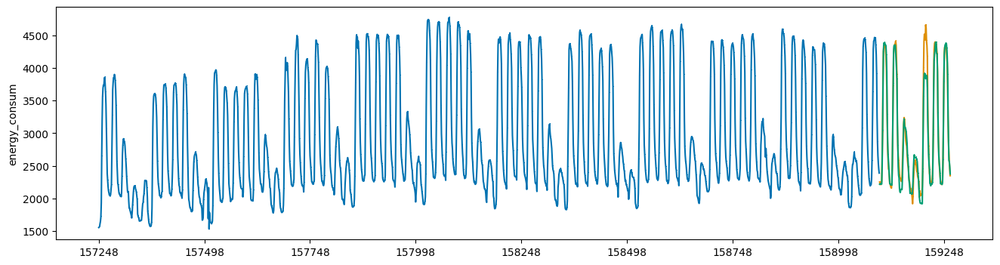

In [ ]:
lgbm_evaluation(train_ft_79, test_ft_79)

## 80

[LightGBM] [Info] Total Bins 1110
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 13
[LightGBM] [Info] Start training from score 2551.878115
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[57]	training's l2: 11394.8	training's SMAPE: 1.36007	valid_1's l2: 39999.3	valid_1's SMAPE: 2.12258
SMAPE_SCORE : 2.12257810091757
[LightGBM] [Info] Total Bins 1119
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 13
[LightGBM] [Info] Start training from score 2570.756605
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 4.

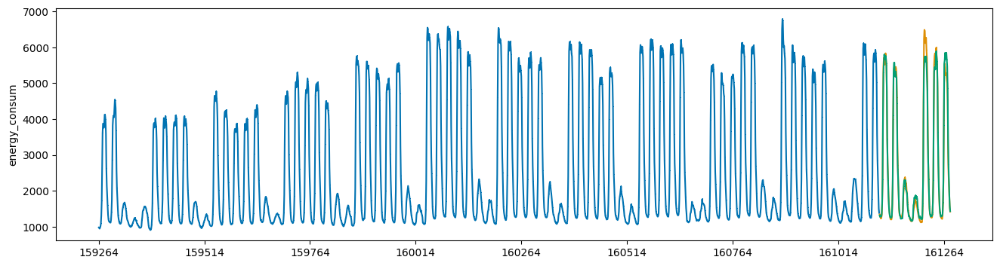

In [ ]:
lgbm_evaluation(train_ft_80, test_ft_80)

## 81

[LightGBM] [Info] Total Bins 1274
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 1443.027466
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[87]	training's l2: 1615.1	training's SMAPE: 1.05761	valid_1's l2: 4731.34	valid_1's SMAPE: 1.54828
SMAPE_SCORE : 1.5482805162170326
[LightGBM] [Info] Total Bins 1284
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 1448.854463
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 4

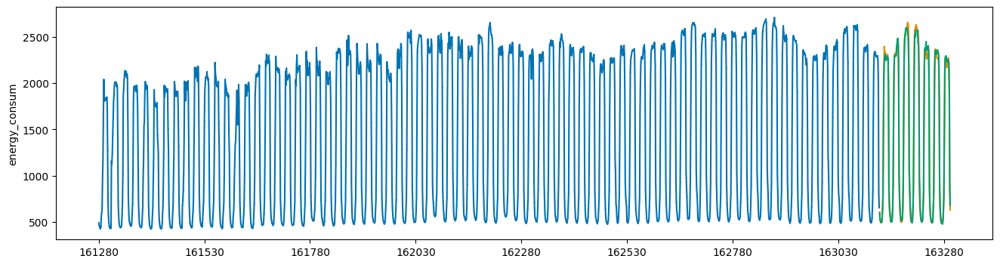

In [ ]:
lgbm_evaluation(train_ft_81, test_ft_81)

## 82

[LightGBM] [Info] Total Bins 1221
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 13
[LightGBM] [Info] Start training from score 2284.939869
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[51]	training's l2: 8069.06	training's SMAPE: 1.47648	valid_1's l2: 62714.9	valid_1's SMAPE: 3.30089
SMAPE_SCORE : 3.300887301249965
[LightGBM] [Info] Total Bins 1231
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 13
[LightGBM] [Info] Start training from score 2299.541071
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 4

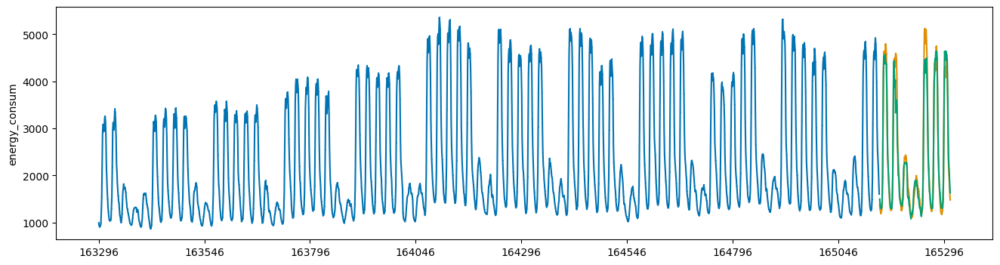

In [ ]:
lgbm_evaluation(train_ft_82, test_ft_82)

## 83

[LightGBM] [Info] Total Bins 1282
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 1445.917371
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[43]	training's l2: 5876.69	training's SMAPE: 1.60232	valid_1's l2: 20480.5	valid_1's SMAPE: 2.63643
SMAPE_SCORE : 2.636425095938619
[LightGBM] [Info] Total Bins 1291
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 1453.059971
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 4

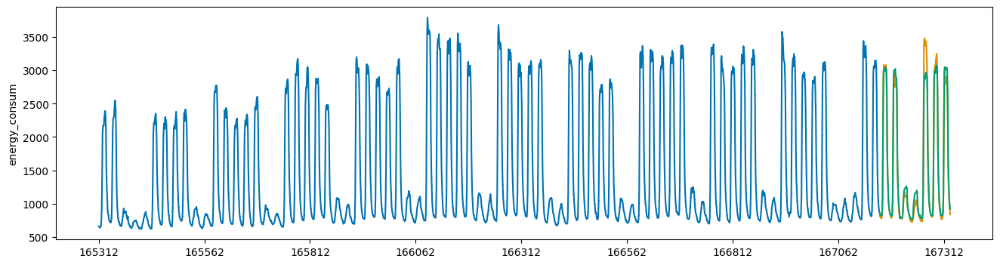

In [ ]:
lgbm_evaluation(train_ft_83, test_ft_83)

## 84

[LightGBM] [Info] Total Bins 1284
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 1723.215585
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[42]	training's l2: 4241.32	training's SMAPE: 1.22574	valid_1's l2: 19300.2	valid_1's SMAPE: 1.91046
SMAPE_SCORE : 1.9104619674893033
[LightGBM] [Info] Total Bins 1293
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 1729.795239
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 

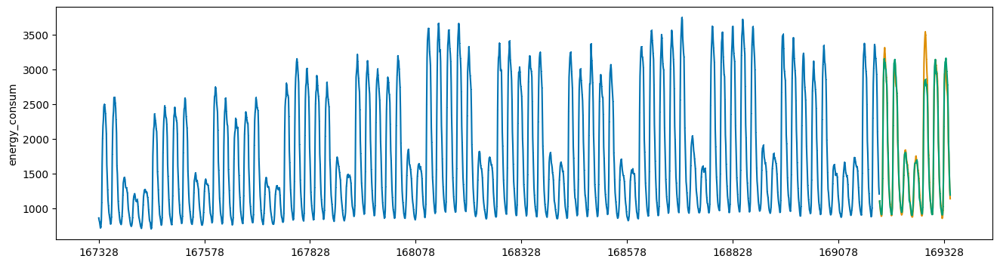

In [ ]:
lgbm_evaluation(train_ft_84, test_ft_84)

## 85

[LightGBM] [Info] Total Bins 1274
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 2251.245778
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[68]	training's l2: 1577.07	training's SMAPE: 0.659268	valid_1's l2: 9406.02	valid_1's SMAPE: 1.68354
SMAPE_SCORE : 1.6835418645120213
[LightGBM] [Info] Total Bins 1284
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 2263.376605
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488,

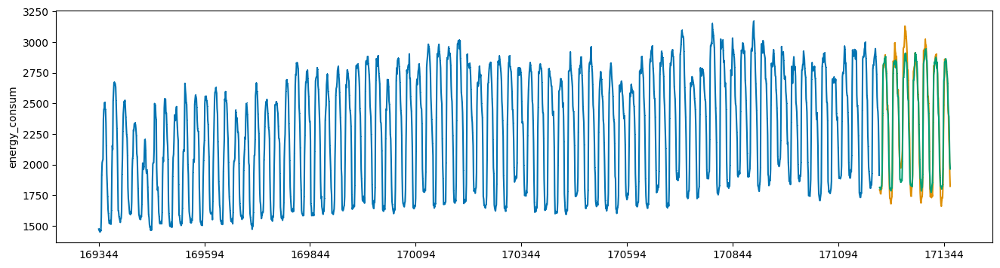

In [ ]:
lgbm_evaluation(train_ft_85, test_ft_85)

## 86

[LightGBM] [Info] Total Bins 1282
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 1145.162532
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[98]	training's l2: 1373.76	training's SMAPE: 1.27771	valid_1's l2: 10897.6	valid_1's SMAPE: 3.10058
SMAPE_SCORE : 3.1005761470746687
[LightGBM] [Info] Total Bins 1291
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 1150.644374
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 

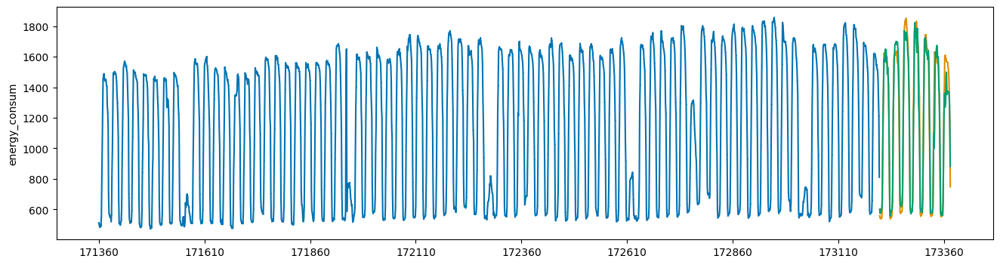

In [ ]:
lgbm_evaluation(train_ft_86, test_ft_86)

## 87

[LightGBM] [Info] Total Bins 1270
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 1277.000407
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[27]	training's l2: 14973	training's SMAPE: 4.22328	valid_1's l2: 26177.7	valid_1's SMAPE: 4.75723
SMAPE_SCORE : 4.757232422980166
[LightGBM] [Info] Total Bins 1280
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 1291.963527
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 4.1

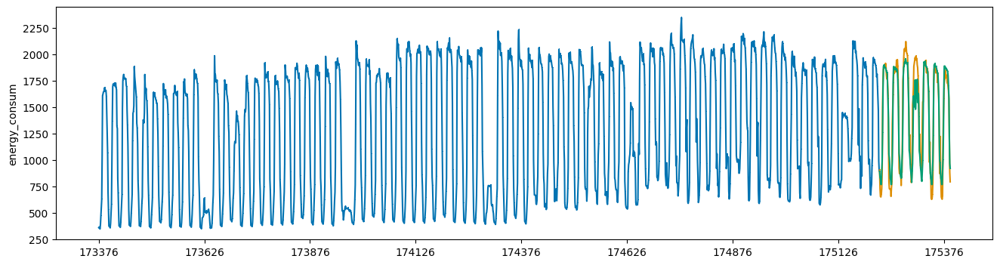

In [ ]:
lgbm_evaluation(train_ft_87, test_ft_87)

## 88

[LightGBM] [Info] Total Bins 1265
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 1191.541706
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[18]	training's l2: 23406.9	training's SMAPE: 6.51764	valid_1's l2: 60243.8	valid_1's SMAPE: 7.28142
SMAPE_SCORE : 7.281423006566061
[LightGBM] [Info] Total Bins 1275
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 1196.471742
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 4

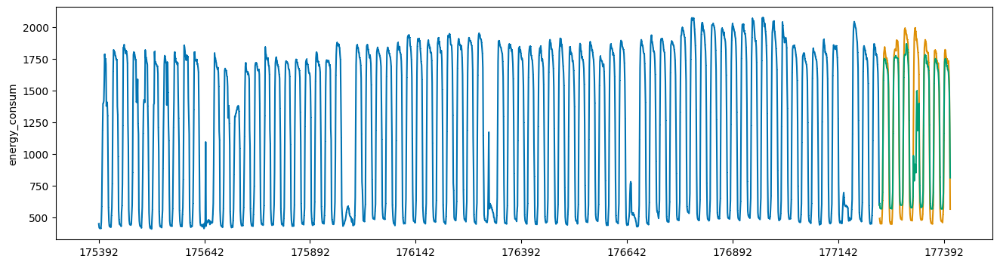

In [ ]:
lgbm_evaluation(train_ft_88, test_ft_88)

## 89

[LightGBM] [Info] Total Bins 1267
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 1428.498830
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[16]	training's l2: 49981.9	training's SMAPE: 8.18513	valid_1's l2: 124158	valid_1's SMAPE: 8.81029
SMAPE_SCORE : 8.810293390563906
[LightGBM] [Info] Total Bins 1277
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 1436.786189
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 4.

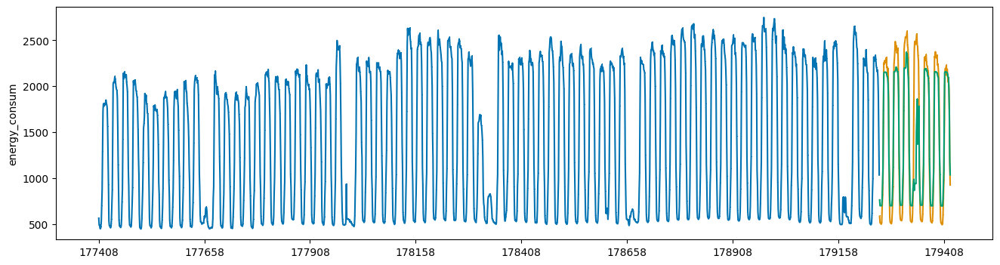

In [ ]:
lgbm_evaluation(train_ft_89, test_ft_89)

## 90

[LightGBM] [Info] Total Bins 1271
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 1377.120911
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[38]	training's l2: 14104.5	training's SMAPE: 3.11885	valid_1's l2: 88638.7	valid_1's SMAPE: 5.45814
SMAPE_SCORE : 5.458139362298694
[LightGBM] [Info] Total Bins 1286
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 1388.329883
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 4

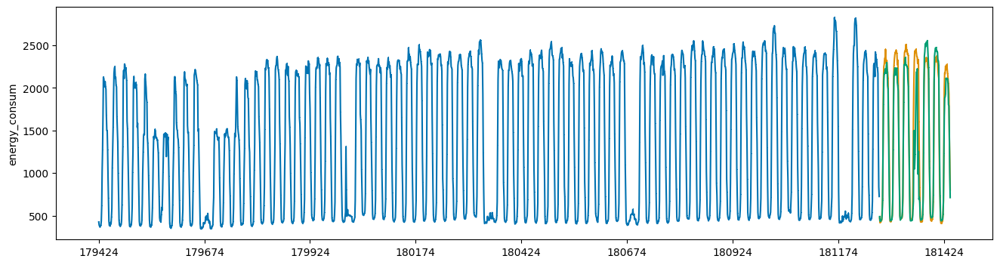

In [ ]:
lgbm_evaluation(train_ft_90, test_ft_90)

## 91

[LightGBM] [Info] Total Bins 1218
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 13
[LightGBM] [Info] Start training from score 1321.630648
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[25]	training's l2: 13987.6	training's SMAPE: 4.73637	valid_1's l2: 36704.4	valid_1's SMAPE: 7.00305
SMAPE_SCORE : 7.003048418065977
[LightGBM] [Info] Total Bins 1226
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 13
[LightGBM] [Info] Start training from score 1327.730832
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 4

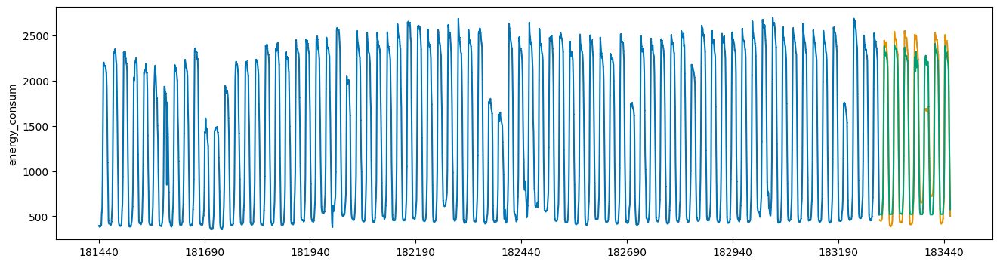

In [ ]:
lgbm_evaluation(train_ft_91, test_ft_91)

## 92

[LightGBM] [Info] Total Bins 1233
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 13
[LightGBM] [Info] Start training from score 1286.162631
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[33]	training's l2: 7633.25	training's SMAPE: 2.50294	valid_1's l2: 25989.6	valid_1's SMAPE: 3.37904
SMAPE_SCORE : 3.3790406102115402
[LightGBM] [Info] Total Bins 1241
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 13
[LightGBM] [Info] Start training from score 1285.541965
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 

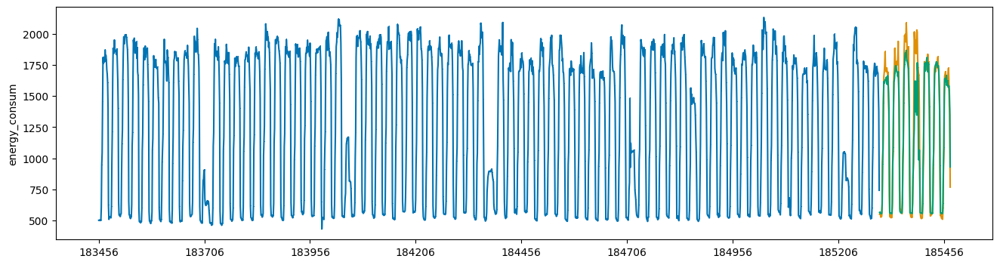

In [ ]:
lgbm_evaluation(train_ft_92, test_ft_92)

## 93

[LightGBM] [Info] Total Bins 1274
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 1102.524740
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[51]	training's l2: 953.945	training's SMAPE: 1.13133	valid_1's l2: 7345.01	valid_1's SMAPE: 3.03608
SMAPE_SCORE : 3.036077348847945
[LightGBM] [Info] Total Bins 1284
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 1108.170893
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 4

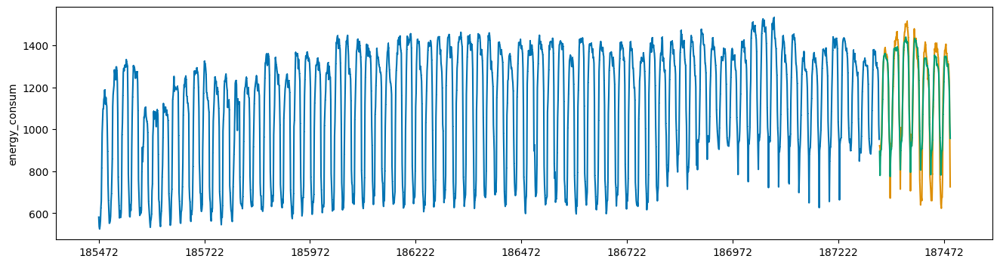

In [ ]:
lgbm_evaluation(train_ft_93, test_ft_93)

## 94

[LightGBM] [Info] Total Bins 1274
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 2449.506882
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[28]	training's l2: 14748.8	training's SMAPE: 2.0937	valid_1's l2: 54869.7	valid_1's SMAPE: 3.61622
SMAPE_SCORE : 3.6162165255360903
[LightGBM] [Info] Total Bins 1284
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 2465.009523
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 4

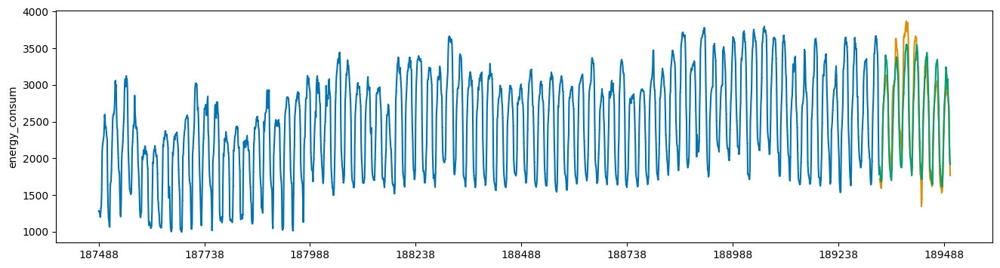

In [ ]:
lgbm_evaluation(train_ft_94, test_ft_94)

## 95

[LightGBM] [Info] Total Bins 1268
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 1112.910681
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[21]	training's l2: 21912.3	training's SMAPE: 5.52059	valid_1's l2: 45452.8	valid_1's SMAPE: 8.14094
SMAPE_SCORE : 8.140935097921556
[LightGBM] [Info] Total Bins 1279
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 1113.724910
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 4

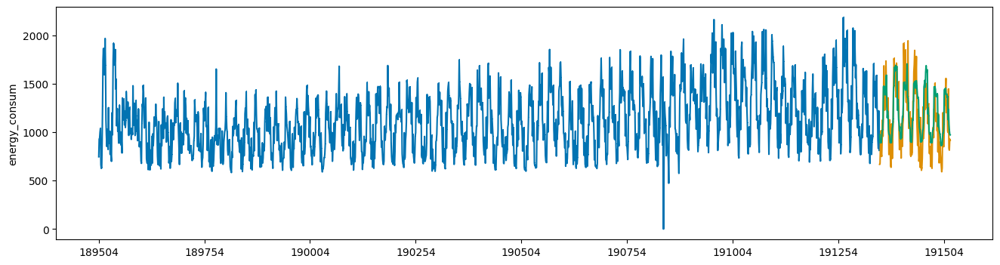

In [ ]:
lgbm_evaluation(train_ft_95, test_ft_95)

## 96

[LightGBM] [Info] Total Bins 1270
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 2804.841137
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[92]	training's l2: 2613.19	training's SMAPE: 0.74005	valid_1's l2: 17096.7	valid_1's SMAPE: 1.74553
SMAPE_SCORE : 1.7455308532846954
[LightGBM] [Info] Total Bins 1286
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 2815.258244
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 

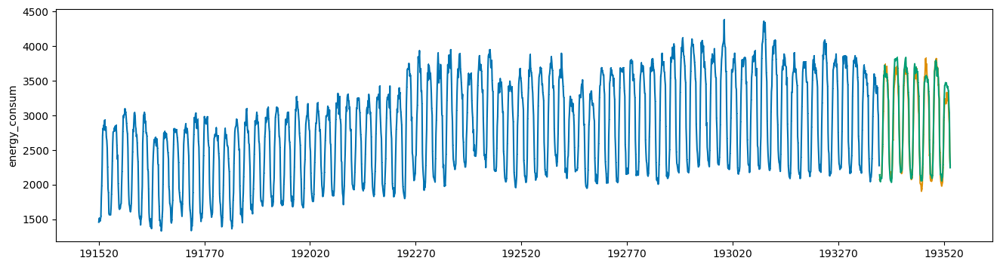

In [ ]:
lgbm_evaluation(train_ft_96, test_ft_96)

## 97

[LightGBM] [Info] Total Bins 1276
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 1227.729253
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[88]	training's l2: 1280.94	training's SMAPE: 1.20875	valid_1's l2: 7069.58	valid_1's SMAPE: 2.27807
SMAPE_SCORE : 2.2780699899100787
[LightGBM] [Info] Total Bins 1285
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 1240.199910
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 

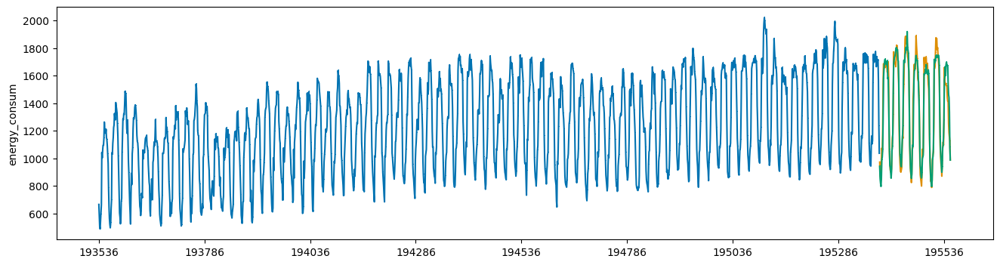

In [ ]:
lgbm_evaluation(train_ft_97, test_ft_97)

## 98

[LightGBM] [Info] Total Bins 1247
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 1136.092402
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[64]	training's l2: 3192.7	training's SMAPE: 2.13622	valid_1's l2: 28359	valid_1's SMAPE: 6.19942
SMAPE_SCORE : 6.199415530732077
[LightGBM] [Info] Total Bins 1261
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 1138.321696
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 4.19

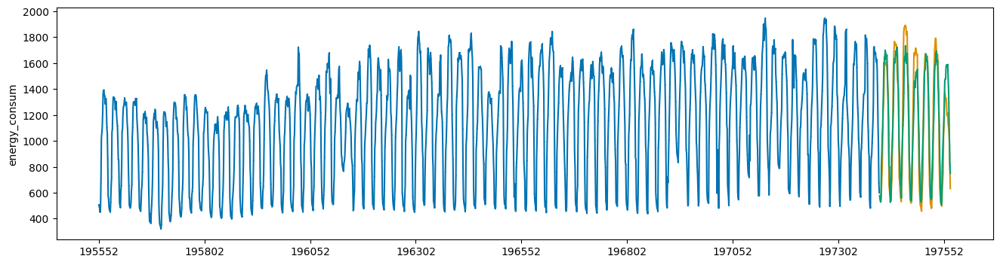

In [ ]:
lgbm_evaluation(train_ft_98, test_ft_98)

## 99

[LightGBM] [Info] Total Bins 1274
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 1161.630877
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[29]	training's l2: 1642.58	training's SMAPE: 1.49212	valid_1's l2: 3088.09	valid_1's SMAPE: 2.03402
SMAPE_SCORE : 2.0340154119713776
[LightGBM] [Info] Total Bins 1284
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 1162.119196
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 

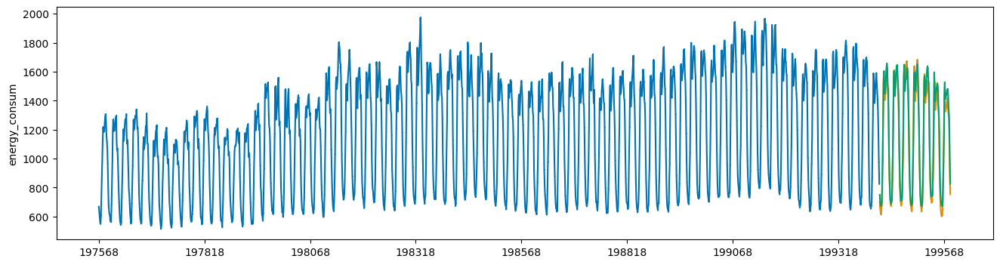

In [ ]:
lgbm_evaluation(train_ft_99, test_ft_99)

## 100

[LightGBM] [Info] Total Bins 1265
[LightGBM] [Info] Number of data points in the train set: 1848, number of used features: 14
[LightGBM] [Info] Start training from score 822.422209
Training until validation scores don't improve for 300 rounds
Did not meet early stopping. Best iteration is:
[65]	training's l2: 911.522	training's SMAPE: 1.43297	valid_1's l2: 3144.86	valid_1's SMAPE: 2.44836
SMAPE_SCORE : 2.4483622794344755
[LightGBM] [Info] Total Bins 1276
[LightGBM] [Info] Number of data points in the train set: 2016, number of used features: 14
[LightGBM] [Info] Start training from score 826.264167
[3.0844281297944103, 4.6678268017904045, 7.4323617990910344, 2.389363956652109, 3.5622318502781005, 2.088941268327012, 3.8353499022781676, 2.7447333841069073, 1.8352961294404533, 4.615294244957945, 1.7217950210635244, 1.9416968037954694, 2.60930990476679, 8.352107999492814, 1.8703864648084705, 2.9747165182759012, 3.338581739055377, 3.5937803353432907, 4.700170557309832, 3.489000966985488, 4.

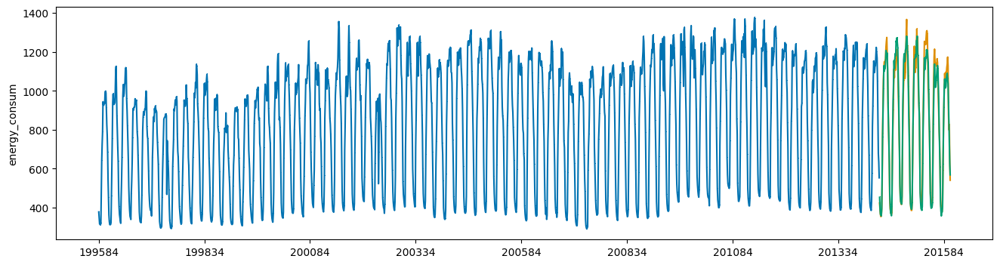

In [ ]:
lgbm_evaluation(train_ft_100, test_ft_100)

# 제출

In [ ]:
submission = pd.read_csv(f"{DATA_PATH}sample_submission.csv")

In [ ]:
len(lgbm_preds)

16800

In [ ]:
train_ft.columns

Index(['energy_consum', 'building_num', 'temp', 'precip', 'wind', 'hum', 'day',
       'month', 'week', 'day_of_year', 'sin_time', 'cos_time', 'THI',
       'feels_temp', 'CDH', 'hour_mean'],
      dtype='object')

In [ ]:
submission.iloc[:, 1] = lgbm_preds

In [ ]:
submission.to_csv(f"{DATA_PATH}submission_feature7.csv", index=False)

In [ ]:
submission.to_csv("submission_feature7.csv", index=False)

In [ ]:
pd.DataFrame(smape_score)

,0
0,3.084428
1,4.667827
2,7.432362
3,2.389364
4,3.562232
...,...
95,1.745531
96,2.278070
97,6.199416
98,2.034015
